In [1]:
#hide code
from IPython.display import display
from IPython.display import HTML
import IPython.core.display as di
di.display_html('<script>jQuery(function() {if (jQuery("body.notebook_app").length == 0) \
{ jQuery(".input_area").toggle(); jQuery(".prompt").toggle();}});</script>', raw=True)
CSS = """#notebook div.output_subarea {max-width:100%;}"""
HTML('<style>{}</style>'.format(CSS))

In [2]:
#import
import string
from collections import namedtuple
import scipy.io as sio
import random
import pandas as pd
import numpy as np
import os
import seaborn as sns
from general_function import *
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
from matplotlib.font_manager import FontProperties
plt.rcParams['font.sans-serif'] = ['SimHei']  #用来正常显示中文标签
plt.rcParams['axes.unicode_minus'] = False  #用来正常显示负号
sns.set(style="whitegrid")
import copy
myfont = FontProperties(fname=r'C:\Windows\Fonts\simhei.ttf', size=10)
from matplotlib.font_manager import FontProperties
#myfont = FontProperties(fname='/Library/Fonts/Songti.ttc')
sns.set(
    font=myfont.get_name(),
    style="whitegrid",
    palette="muted",
    color_codes=True)
import warnings
warnings.filterwarnings("ignore")
from statsmodels.regression.linear_model import OLS
import random
from scipy import stats
from time import sleep

In [3]:
from WindPy import *
w.start()

Welcome to use Wind Quant API for Python (WindPy)!

COPYRIGHT (C) 2017 WIND INFORMATION CO., LTD. ALL RIGHTS RESERVED.
IN NO CIRCUMSTANCE SHALL WIND BE RESPONSIBLE FOR ANY DAMAGES OR LOSSES CAUSED BY USING WIND QUANT API FOR Python.


.ErrorCode=0
.Data=[OK!]

In [4]:
# 存储全部模型净值数据的地址
volume = pd.read_csv('volume.csv', index_col = 0)
os.chdir(r'F:\金湖回测系统\6日循环\结果存放文件夹')

In [5]:
cnames = ['dimgrey',
          'rosybrown',
          'brown',
          'red',
          'salmon',
          'sienna',
          'chocolate',
          'peru',
          'darkorange',
          'tan',
          'orange',
          'wheat',
          'goldenrod',
          'gold',
          'khaki',
          'olive',
          'y',
          'yellow',
          'olivedrab',
          'lawngreen',
          'green',
          'turquoise',
          'teal',
          'deepskyblue',
          'royalblue',
          'slateblue',
          'violet',
          'magenta',
          'hotpink',
          'lightpink',
          ]
#random.shuffle(cnames)

In [6]:
def max_drawdown(a):
    start_flag = 0
    cur_max = 0
    old_max = 0
    start = None
    end = None
    best_start = None
    best_end = None
    for index, value in enumerate(a):
        if value <= 0:
            if pd.isnull(start):
                start = index
            start_flag = 1
            cur_max += value
            end = index
        if value > 0:
            if value > -cur_max:
                cur_max = 0
                start_flag = 0
                start = None
            else:
                cur_max += value
        if cur_max < old_max:
            old_max = cur_max
            best_start = start
            best_end = end
    return min(old_max, cur_max)
def max_drawdown_with_se(a):
    start_flag = 0
    cur_max = 0
    old_max = 0
    start = None
    end = None
    best_start = None
    best_end = None
    for index, value in enumerate(a):
        if value <= 0:
            if pd.isnull(start):
                start = index
            start_flag = 1
            cur_max += value
            end = index
        if value > 0:
            if value > -cur_max:
                cur_max = 0
                start_flag = 0
                start = None
            else:
                cur_max += value
        if cur_max < old_max:
            old_max = cur_max
            best_start = start
            best_end = end
    return min(old_max, cur_max), best_start, best_end
def listdir(contain, file_type, path='.'):
    file_list = []
    for file in os.listdir(path):
        file_path = os.path.join(path, file)
        if os.path.isdir(file_path):
            continue
        elif str(contain) in str(
                file_path) and file_path[-len(file_type):] == file_type:
            file_list.append(file_path)
    return file_list
def myAlign(string, normal_space, chinese_space):
    n_normal_space_had = 0
    n_chinese_space_had = 0
    for ch in string:
        if '\u4e00' <= ch <= '\u9fff':
            n_chinese_space_had += 1
        else:
            n_normal_space_had += 1
    n_normal_space_needed = max((normal_space - n_normal_space_had), 0)
    n_chinese_space_needed = max((chinese_space - n_chinese_space_had), 0)
    return string + ' ' * n_normal_space_needed + u'　' * n_chinese_space_needed

In [7]:
first_date = '2017-01-02'
last_date = '2019-08-22'

In [8]:
#read data from Wind
data = w.wsd("000905.SH", "pct_chg", first_date, last_date, "PriceAdj=B")
hs300data = w.wsd("000300.SH", "pct_chg", first_date, last_date, "PriceAdj=B")
Rdata = w.edb("M1000158", str(data.Times[0]), last_date, "Fill=Previous")
zz500 = pd.DataFrame(
    data.Data[0], index=data.Times, columns=['zz500'])['zz500']
zz500.index = [int(str(i).replace('-', '')) for i in zz500.index]
hs300 = pd.DataFrame(
    hs300data.Data[0], index=hs300data.Times, columns=['hs300'])['hs300']
hs300.index = [int(str(i).replace('-', '')) for i in hs300.index]
R = pd.DataFrame(Rdata.Data[0], index=Rdata.Times, columns=['R'])['R']
R.index = [int(str(i).replace('-', '')) for i in R.index]
R = R.loc[zz500.index] / 252
zz500.to_csv('zz500.csv')
hs300.to_csv('hs300.csv')
R.to_csv('R.csv')

In [9]:
#read data from local
zz500 = pd.read_csv('zz500.csv', index_col=0, header=None)[1]
hs300 = pd.read_csv('hs300.csv', index_col=0, header=None)[1]
R = pd.read_csv('R.csv', index_col=0, header=None)[1]
R.fillna(method='ffill', inplace=True)

In [10]:
#model update time
os.chdir(r'F:\金湖回测系统\6日循环\要测文件')
filenames = listdir(contain='',file_type='.mat')
filenames_ = [[i.split('.\\')[-1].split('_')[0],i[5:9],0] if '万' not in i else \
              [i.split('.\\')[-1].split('_')[0],i[5:9],i.split('万')[0][-4:]] for i in filenames]
def process(df):
    return df.index.tolist()
by_model = pd.DataFrame(filenames_).groupby([0,2]).apply(process)
model_update_date = {}
for (model,limit) in by_model.index:
    if model in ['A2','A3','B4','C3','E2','F1']:
        model_list = by_model.loc[(model,limit)]
        filenames_model = []
        for i in model_list:
            filenames_model.append(filenames[i])
        change_date = []
        for name in sorted(filenames_model)[::-1]:
            os.chdir(r'F:\金湖回测系统\6日循环\要测文件')
            file = sio.loadmat(name)
            date_in_this_file = [i[0][0] for i in file['table'][1]]
            if name == sorted(filenames_model)[0] or date_in_this_file[0] >= 737392:
                change_date.append(int(str(date.fromordinal(int(date_in_this_file[0])-366)).replace('-','')))
            else:
                change_date.append(int(str(date.fromordinal(int(date_in_this_file[1])-366)).replace('-','')))
        change_date = sorted(list(set(change_date)))[::-1]
        model_update_date[model] = change_date
    else:
        model_list = by_model.loc[(model,limit)]
        filenames_model = []
        for i in model_list:
            filenames_model.append(filenames[i])
        change_date = []
        for name in sorted(filenames_model)[::-1]:
            os.chdir(r'F:\金湖回测系统\6日循环\要测文件')
            file = sio.loadmat(name)
            date_in_this_file = [i[0][0] for i in file['table'][1]]
            change_date.append(int(str(date.fromordinal(int(date_in_this_file[0])-366)).replace('-','')))
        change_date = sorted(list(set(change_date)))[::-1]
        model_update_date[model] = change_date
model_update_date['I1'] = sorted(model_update_date['I1'] + [20190513])[::-1]
model_update_date['I2'] = sorted(model_update_date['I2'] + [20190513])[::-1]
model_update_date['I3'] = sorted(model_update_date['I3'] + [20190513])[::-1]
model_update_date['E3'] = [20190717, 20180409]
model_update_date['E4'] = [20190717, 20180409]
model_update_date['I4'] = [20190717, 20181119]
model_update_date['I5'] = [20190717, 20181119]

In [11]:
# 存储全部模型净值数据的地址
os.chdir(r'F:\金湖回测系统\6日循环\结果存放文件夹')

In [12]:
def longeststring(lst):
    longest = ""
    for x in lst:
        if isinstance(x, str) and len(x) > len(longest):
            longest = x
    return longest
def str_count(s):
    count_en = count_zh = 0
    s_len = len(s)
    for c in s:
        if c in string.ascii_letters:
            count_en += 1
        elif c.isalpha():
            count_zh += 1
        else:
            count_en += 1
    total_chars = count_zh + count_en
    if total_chars == s_len:
        return namedtuple('Count', ['total', 'zh', 'en'])(s_len, count_zh, count_en)
    else:
        print('Something is wrong!')
        return None

In [13]:
#其实就下面这个画图函数最重要：
#file_list                                                   画图的原始文件（回测结果）
#value_type = '对冲'                                          画alpha还是收益曲线
#directory = r'F:\金湖回测系统\6日循环\结果存放文件夹',         画图的原始文件存放的地址
#start_together = 0                                          起始日期不同的模型在图中是否同时开始
#length_list = [0]                                           画多久的（天）
#step = 0                                                    没大用，step不是0的时候会取整，比如设置为5时，19天的数据只会画最后15天的
#shorted_label = 0                                           图例和文字显示的部分是否是缩减版的
#figsize = None                                              图的大小，不建议改
#start_date = 0                                              日期比start_date小的不会画
#end_date = 99999999                                         日期比end_date大的不会画
#title = None                                                图的标题 
#printing = False                                            是否print一下画图的数值，bebug可能用
#weights = None                                              按比例画一条黑线
#save = None                                                 是否保存图片
#substract = False                                           file_list中有且仅有两文件时有效，画一条两条曲线差值的曲线
#legend = True                                               是否有图例
#huiche_range = 0.2                                           右y轴（回撤轴）值域上阈值
#fuli = False                                                 是否用复利
#return_df = False                                            是否return文件数值
#plot_volume = False                                          是否画zz500成交量，不成熟的功能
#dafen = False                                                是否打印打分，不成熟的功能

In [14]:
def general_plot(file_list, value_type = '对冲', directory = r'F:\金湖回测系统\6日循环\结果存放文件夹', \
                 start_together = 0, length_list = [0], step = 0, shorted_label = 0, figsize = None, \
                 start_date = 0, end_date = 99999999, title = None, printing = False, weights = None, \
                 save = None, substract = False, legend = True, huiche_range = 0.2, fuli = False, \
                 return_df = False, plot_volume = False, dafen = False):
    if '月度' in file_list[0]:
        annualize_factor = 12
    else:
        annualize_factor = 252
    #最长的filename
    zh = 0
    en = 0
    for filename in file_list:
        zh = max(zh, str_count(filename).zh)
        en = max(en, str_count(filename).en)
    #保存图片
    if save:
        if type(save) == str:
            save = [save]
    #对冲是文件里的第二列，多头是第一列
    if value_type == '对冲':
        value_type_int = 1
    elif value_type == '多头':
        value_type_int = 0
    else:
        print('value_type must be 多头 or 对冲')
        return
    #画最近n天的，因为会直接截掉，所以要反着sort一下
    if type(length_list) != list:
        length_list = [length_list]
    length_list = sorted(length_list)[::-1]
    if length_list[-1] == 0:
        length_list = [0] + length_list[:-1]
    #进入保存净值文件的目录
    os.chdir(directory)
    #把需要的净值文件读到一个DataFrame里
    full_portfolio = pd.DataFrame()
    for file in file_list:
        portfolio = pd.read_excel(file, index_col=0).iloc[:, value_type_int]
        ret = portfolio.diff()
        ret.iloc[0] = portfolio.iloc[0]
        full_portfolio = pd.concat([full_portfolio, ret], axis=1)
    #截掉start_date以前和end_date以后的
    full_portfolio = full_portfolio[(full_portfolio.index>=start_date) & (full_portfolio.index<=end_date)]
    #如果start_together，则去掉nan的
    if start_together == 0:
        full_portfolio.dropna(inplace = True)
    #如果设置了step，则取step整数倍长度的
    if step != 0:
        full_portfolio = full_portfolio.iloc[len(full_portfolio)%step:]
        length_list = [0]
    #画图
    for length_index,length in enumerate(length_list):
        #截掉多余长度的
        if length != 0:
            full_portfolio = full_portfolio.iloc[-length:]
        #!plot start
        if figsize:
            fig = plt.figure(figsize=figsize)
        else:
            fig = plt.figure(figsize=(16,int(np.ceil(len(list(full_portfolio))/2))+6))
        gs1 = GridSpec(int(np.ceil(len(list(full_portfolio))/2))+6, 1)
        #ax1 用来打印文件名和相应的指标，比如夏普比率等
        ax1 = plt.subplot(gs1[:-6, :])
        #ax2 用来绘制收益曲线
        ax2 = plt.subplot(gs1[-6:, :])
        #ax3 用来绘制回撤曲线
        ax3 = ax2.twinx()
        #ax1 中打印时使用的间隙大小
        space = 1/max((len(list(full_portfolio)))*2-1,2)
        for i, ax in enumerate(fig.axes):
            ax.tick_params(labelbottom=False, labelleft=False)
            ax.axis('off')
            break
        ax3.set_ylim(0,huiche_range)
        ax3.grid(False)
        if shorted_label == 1:
            ax1.text(0,space*(len(list(full_portfolio))+3),\
                    '               年化收益%   波动%       夏普     最大回撤%   MAR',fontsize = 16)
        else:
            ax1.text(0,space*(len(list(full_portfolio))+3),\
                    myAlign(' ', en, zh)+\
                    '     年化收益%   波动%       夏普     最大回撤%   MAR',fontsize = 16)
        #如果设置了weights，会根据weights画一条加权平均的曲线
        if weights:
            weights = [wght/np.sum(weights) for wght in weights]
            ret = (full_portfolio*weights).sum(axis=1)
            rf_ret = R.loc[ret.index]
            measure_ret_a = ret.mean() * 100 * annualize_factor
            measure_vol_a = (ret * 100).std() * np.sqrt(annualize_factor)
            measure_sr_a = np.sqrt(annualize_factor) * (((ret.dropna()*100).mean() - rf_ret.mean())/(ret.dropna()*100).std())
            measure_md = max_drawdown(ret * 100)
            measure_mar = (np.inf if measure_md == 0 else -measure_ret_a / measure_md)
            ax1.text(0,space*(len(list(full_portfolio))+2),\
                    myAlign('加权平均', en, zh)+\
                    '    %8.4f'%measure_ret_a+'   %8.4f'%measure_vol_a+\
                    '   %8.4f'%measure_sr_a+'   %8.4f'%measure_md+'   %8.4f'%measure_mar,fontsize = 16,color='red')
            if fuli:
                ax2.plot(((ret+1).cumprod()-1).tolist(), color = 'black', label='mean', linewidth = 1.5)
            else:
                ax2.plot(ret.cumsum().tolist(), color = 'black', label='mean', linewidth = 1.5)
                ax3.fill_between(range(len(ret)),0,(ret.cumsum().rolling(window = len(ret), min_periods = 0).max() - \
                    ret.cumsum()).tolist(), alpha = 0.05, color = 'black')
                if len(file_list) > 5:
                    ax3.plot((ret.cumsum().rolling(window = len(ret), min_periods = 0).max() - ret.cumsum()).tolist(),\
                        alpha = 0.5, linewidth = 1, color = 'black')
                else:
                    ax3.plot((ret.cumsum().rolling(window = len(ret), min_periods = 0).max() - ret.cumsum()).tolist(),\
                        alpha = 0.5, color = 'black')
        #如果substract为True，且参与绘制的文件有且仅有两个，会绘制一条两曲线的差值
        if substract and len(file_list) == 2:
            if fuli:
                ret = (full_portfolio.iloc[:, 0]+1).cumprod() - (full_portfolio.iloc[:, 1]+1).cumprod()
                ax2.plot(ret.tolist(), 'black')
            else:
                ret = full_portfolio.iloc[:, 0].cumsum() - full_portfolio.iloc[:, 1].cumsum()
                ax2.plot(ret.tolist(), 'black')
            ax3.fill_between(range(len(ret)), 0, (ret.rolling(window = len(ret), min_periods = 0).max() - ret).tolist(), \
                             color = 'black', alpha = 0.05)
            ax3.plot((ret.rolling(window = len(ret), min_periods = 0).max() - ret).tolist(), color='black', alpha = 0.5)
            
        #正常的收益曲线和回撤曲线绘制
        for index, value in enumerate(list(full_portfolio)):
            ret = full_portfolio.iloc[:, index]
            if dafen:
                #打分。。。mean(0.5-10*单日对冲收益率)。。。
                if ('J2' in file_list[index]):
                    n_hold = 12
                elif ('E3' in file_list[index] or 'E4' in file_list[index]):
                    n_hold = 6
                elif ('I3' in file_list[index] or 'I4' in file_list[index]):
                    n_hold = 9
                elif ('B3' in file_list[index] or 'B4' in file_list[index]):
                    n_hold = 2
                cost = 0.005/n_hold
                print(file_list[index], (0.5-10*(ret+cost)).mean())
            rf_ret = R.loc[ret.index]
            if fuli:
                measure_ret_a = ((((ret+1).cumprod().iloc[-1])**(1/len(ret)))**annualize_factor - 1)*100
            else:
                measure_ret_a = ret.mean() * 100 * annualize_factor
            measure_vol_a = (ret * 100).std() * np.sqrt(annualize_factor)
            measure_sr_a = np.sqrt(annualize_factor) * (((ret.dropna()*100).mean() - rf_ret.mean())/(ret.dropna()*100).std())
            measure_md = max_drawdown(ret * 100)
            measure_mar = (np.inf if measure_md == 0 else -measure_ret_a / measure_md)
            if shorted_label == 1:
                label = file_list[index].replace('long_7.7_v3_2','H3').replace('long_7.7_v1_1','H2')\
                    .replace('yang_7.7','H1').split('(')[-1].split(')')[0]
                ax1.text(0,space*(len(list(full_portfolio))+2) - space*(index+1),\
                    myAlign(label, 4, 4)+'    %8.4f'%measure_ret_a+'   %8.4f'%measure_vol_a+\
                    '   %8.4f'%measure_sr_a+'   %8.4f'%measure_md+'   %8.4f'%measure_mar,fontsize = 16)
            else:
                label = file_list[index].replace('long_7.7_v3_2','H3').replace('long_7.7_v1_1','H2')\
                    .replace('yang_7.7','H1')[:-5]
                ax1.text(0,space*(len(list(full_portfolio))+2) - space*(index+1),\
                    myAlign(label, en, zh)+\
                    '    %8.4f'%measure_ret_a+'   %8.4f'%measure_vol_a+\
                    '   %8.4f'%measure_sr_a+'   %8.4f'%measure_md+'   %8.4f'%measure_mar,fontsize = 16)
            if len(list(full_portfolio)) > len(cnames) or weights:
                if fuli:
                    ax3.fill_between(range(len(ret)),0,(((ret+1).cumprod()-1).rolling(window = len(ret), min_periods = 0).max() - \
                        ((ret+1).cumprod()-1)).tolist(), alpha = 0.05)
                    if len(file_list) > 5:
                        ax3.plot((((ret+1).cumprod()-1).rolling(window = len(ret), min_periods = 0).max() - ((ret+1).cumprod()-1)).tolist(),\
                            alpha = 0.5, linewidth = 1)
                    else:
                        ax3.plot((((ret+1).cumprod()-1).rolling(window = len(ret), min_periods = 0).max() - ((ret+1).cumprod()-1)).tolist(),\
                            alpha = 0.5)
                else:
                    ax3.fill_between(range(len(ret)),0,(ret.cumsum().rolling(window = len(ret), min_periods = 0).max() - \
                        ret.cumsum()).tolist(), alpha = 0.05)
                    if len(file_list) > 5:
                        ax3.plot((ret.cumsum().rolling(window = len(ret), min_periods = 0).max() - ret.cumsum()).tolist(),\
                            alpha = 0.5, linewidth = 1)
                    else:
                        ax3.plot((ret.cumsum().rolling(window = len(ret), min_periods = 0).max() - ret.cumsum()).tolist(),\
                            alpha = 0.5)
                if fuli:
                    if len(file_list) > 5:
                        ax2.plot(((ret+1).cumprod()-1).tolist(), label=label, linewidth = 1, alpha = 0.2)
                    else:
                        ax2.plot(((ret+1).cumprod()-1).tolist(), label=label)
                else:
                    if len(file_list) > 5:
                        ax2.plot(ret.cumsum().tolist(), label=label, linewidth = 1, alpha = 0.2)
                    else:
                        ax2.plot(ret.cumsum().tolist(), label=label)
                
            else:
                if fuli:
                    ax3.fill_between(range(len(ret)),0,(((ret+1).cumprod()-1).rolling(window = len(ret), min_periods = 0).max() - \
                        ((ret+1).cumprod()-1)).tolist(), alpha = 0.05, color = cnames[index])
                    if len(file_list) > 5:
                        ax3.plot((((ret+1).cumprod()-1).rolling(window = len(ret), min_periods = 0).max() - ((ret+1).cumprod()-1)).tolist(),\
                            alpha = 0.5, color = cnames[index], linewidth = 1)
                    else:
                        ax3.plot((((ret+1).cumprod()-1).rolling(window = len(ret), min_periods = 0).max() - ((ret+1).cumprod()-1)).tolist(),\
                            alpha = 0.5, color = cnames[index])
                else:
                    ax3.fill_between(range(len(ret)),0,(ret.cumsum().rolling(window = len(ret), min_periods = 0).max() - \
                        ret.cumsum()).tolist(), alpha = 0.05, color = cnames[index])
                    if len(file_list) > 5:
                        ax3.plot((ret.cumsum().rolling(window = len(ret), min_periods = 0).max() - ret.cumsum()).tolist(),\
                            alpha = 0.5, color = cnames[index], linewidth = 1)
                    else:
                        ax3.plot((ret.cumsum().rolling(window = len(ret), min_periods = 0).max() - ret.cumsum()).tolist(),\
                            alpha = 0.5, color = cnames[index])
                if fuli:
                    if len(file_list) > 5:
                        ax2.plot(((ret+1).cumprod()-1).tolist(), color = cnames[index], label=label, linewidth = 1)
                    else:
                        ax2.plot(((ret+1).cumprod()-1).tolist(), color = cnames[index], label=label)
                else:
                    if len(file_list) > 5:
                        ax2.plot(ret.cumsum().tolist(), color = cnames[index], label=label, linewidth = 1)
                    else:
                        ax2.plot(ret.cumsum().tolist(), color = cnames[index], label=label)
                if '最旧' not in file_list[index]:
                    try:
                        if fuli:
                            ax2.plot(((ret+1).cumprod()-1).loc[model_update_date[value[:2]][::-1]].dropna().append(pd.Series(index = ret.index)\
                                [~pd.Series(index = ret.index).index.isin(model_update_date[value[:2]])]).sort_index().tolist(), \
                                marker = 'o', color = cnames[index])
                        else:
                            ax2.plot(ret.cumsum().loc[model_update_date[value[:2]][::-1]].dropna().append(pd.Series(index = ret.index)\
                                [~pd.Series(index = ret.index).index.isin(model_update_date[value[:2]])]).sort_index().tolist(), \
                                marker = 'o', color = cnames[index])
                    except:
                        pass
        #x轴日期
        divider = max(len(full_portfolio)//10,1)
        Xlabel = [index for index,value in enumerate(full_portfolio.index.tolist()) if (len(full_portfolio) - 1 - index)%divider == 0]
        ax2.set_xticks(Xlabel)
        ax2.set_xticklabels([value for index,value in enumerate(full_portfolio.index.tolist()) if (len(full_portfolio) - 1 - index)%divider == 0])
        for tick in ax1.get_xticklabels():
            tick.set_rotation(30)
        #y轴
        ax2.set_ylabel('净值',fontsize = 16)
        ax2.set_ylim(ax2.get_ylim()[0]-ax2.get_ylim()[1]/3, ax2.get_ylim()[1])
        ax3.set_ylabel('回撤',fontsize = 16)
        #legend
        if (weights and len(file_list) > 10) or legend == False:
            pass
        elif len(file_list) > 5:
            ax2.legend(loc = 0, prop=myfont, frameon = True, edgecolor = 'black', ncol = 2)
        else:
            ax2.legend(loc = 0, prop=myfont, frameon = True, edgecolor = 'black')
        #title
        if title:
            plt.title(title)
        else:
            plt.title('最近的'+str(len(full_portfolio))+'天 '+value_type,fontsize = 16)
        #是否打印一下full_portfolio,一般没用
        if printing:
            print(full_portfolio)
            
        #保存图片
        if save:
            ax1.text(0.5,space*(len(list(full_portfolio))+4),save[length_index],fontsize=16,horizontalalignment='center')
            plt.savefig(save[length_index]+'.png')
        plt.show()
        sleep(0.5)
        if plot_volume:
            if figsize:
                fig = plt.figure(figsize=(figsize[0], 3))
            else:
                fig = plt.figure(figsize=(16,3))
            ax = fig.add_subplot(111)
            ax.bar(range(len(full_portfolio)), volume.sum(axis = 1).loc[full_portfolio.index].tolist(),0.5 )
            ax.set_ylabel('全市场成交量',fontsize = 16)
            divider = max(len(full_portfolio)//10,1)
            Xlabel = [index for index,value in enumerate(full_portfolio.index.tolist()) if (len(full_portfolio) - 1 - index)%divider == 0]
            ax.set_xticks(Xlabel)
            ax.set_xticklabels([value for index,value in enumerate(full_portfolio.index.tolist()) if (len(full_portfolio) - 1 - index)%divider == 0])
            plt.show()
    if return_df:
        return full_portfolio
    return

In [15]:
files_last = ['回测_2_(A2)_5000万_7_50支.xlsx', '回测_2_(A3)_5000万_7_50支.xlsx', '回测_2_(A4)_5000万_7_50支.xlsx', \
              '回测_2_(A5)_5000万_7_50支.xlsx', '回测_2_(B3)_5000万_7_50支.xlsx', '回测_2_(B4)_5000万_7_50支.xlsx', \
              '回测_2_(C2)_5000万_7_50支.xlsx', '回测_2_(C4)_5000万_7_50支.xlsx', '回测_2_(C5)_5000万_7_50支.xlsx', \
              '回测_2_(D1)_5000万_7_50支.xlsx', '回测_2_(D2)_5000万_7_50支.xlsx', '回测_3_(G1)_5000万_7_50支.xlsx', \
              '回测_6_(E1)_5000万_7_50支.xlsx', '回测_6_(E2)_5000万_7_50支.xlsx', '回测_6_(E3)_5000万_7_50支.xlsx', \
              '回测_6_(E4)_5000万_7_50支.xlsx', '回测_6_(F1)_5000万_7_50支.xlsx', '回测_7_(H1)_5000万_7_50支.xlsx', \
              '回测_7_(H2)_5000万_7_50支.xlsx', '回测_7_(H3)_5000万_7_50支.xlsx', '回测_9_(I1)_5000万_7_50支.xlsx', \
              '回测_9_(I2)_5000万_7_50支.xlsx', '回测_9_(I3)_5000万_7_50支.xlsx', '回测_9_(I4)_5000万_7_50支.xlsx', \
              '回测_9_(I5)_5000万_7_50支.xlsx', '回测_2_(K4)_5000万_7_50支.xlsx', '回测_2_(K5)_5000万_7_50支.xlsx', \
              '回测_2_(K6)_5000万_7_50支.xlsx', '回测_2_(K7)_5000万_7_50支.xlsx', '回测_12_(J2)_5000万_7_50支.xlsx', ]

In [16]:
df = []
for file in files_last:
    ex_lim = file.split('(')[0][2:-1]
    model = file.split('(')[-1].split(')')[0].split('_')[0]
    sub_model = file.split('(')[-1].split(')')[0][3:]
    if model in ['A2','B1','C2']:
        universe = '3'
    elif model in ['A3','A4','A5','B3','B4','C3','D1','D2']:
        universe = '5'
    elif model in ['G1']:
        universe = '63'
    elif model in ['E1','E2','F1']:
        universe = '6'
    elif model in ['H1','H2','H3']:
        universe = '7'
    elif model in ['I1','I2','I3']:
        universe = '79'
    elif model in ['J2']:
        universe = '712'
    if len(file.split(')')[-1]) == 9:
        lim = 0
    else:
        lim = file.split(')')[-1][1:6]
    n_stock = file.split('_')[-1].split('.')[0]
    portfolio = pd.read_excel(file, index_col=0)
    ret_data = portfolio.diff()
    ret_data.iloc[0, :] = portfolio.iloc[0, :]
    for i in ret_data.columns:
        if '对冲' in i:
            port_ret = ret_data[i]
            index_ret = zz500.loc[port_ret.index]
            rf_ret = R.loc[port_ret.index]
            port_ret = port_ret * 100
            measure_ret = port_ret.mean()
            measure_vol = port_ret.std()
            measure_ret_a = measure_ret * 252
            measure_vol_a = measure_vol * np.sqrt(252)
            measure_exc = (port_ret - index_ret).mean()
            if len(port_ret) >= 20:
                measure_exc_var = (port_ret - index_ret).sort_values().iloc[len(port_ret) // 20]
                measure_exc_tvar = (port_ret - index_ret).sort_values()[:len(port_ret) // 20].mean()
                measure_exc_itvar = (port_ret - index_ret).sort_values()[-len(port_ret) // 20:].mean()
                measure_var = (port_ret).sort_values().iloc[len(port_ret) // 20]
                measure_tvar = (port_ret).sort_values()[:len(port_ret) // 20].mean()
                measure_itvar = (port_ret).sort_values()[-len(port_ret) // 20:].mean()
            else:
                measure_exc_tvar = np.nan
                measure_exc_itvar = np.nan
                measure_var = np.nan
                measure_tvar = np.nan
                measure_itvar = np.nan
            measure_exc_skew = (port_ret - index_ret).skew()
            measure_rettovol = measure_ret_a / measure_vol_a
            measure_sr_a = np.sqrt(252) * (measure_ret - rf_ret.mean()) / measure_vol
            measure_ir_a = np.sqrt(252) * (port_ret - index_ret).mean() / (port_ret - index_ret).std()
            measure_beta = np.cov(port_ret, index_ret)[0][1] / np.cov(port_ret, index_ret)[1][1]
            measure_tr = (measure_ret - rf_ret.mean()) / measure_beta
            measure_ja = measure_ret - (rf_ret.mean() + measure_beta * (index_ret - rf_ret).mean())
            measure_md = max_drawdown(port_ret)
            df.append([ex_lim,model,sub_model,universe,lim,n_stock,len(port_ret),'%8.4f'%measure_ret_a,'%8.4f'%measure_vol_a,\
                       '%8.4f'%measure_exc,'%8.4f'%measure_exc_var,'%8.4f'%measure_exc_tvar,'%8.4f'%measure_exc_itvar,\
                       '%8.4f'%measure_var,'%8.4f'%measure_tvar,'%8.4f'%measure_itvar,'%8.4f'%measure_exc_skew,'%8.4f'%measure_sr_a,\
                       '%8.4f'%measure_ir_a,'%8.4f'%measure_beta,'%8.4f'%measure_tr,'%8.4f'%measure_ja,'%8.4f'%measure_md])
df = pd.DataFrame(df)
df.columns = ['ex_lim','model','sub','universe','lim','n_stock','length','ret_a','vol_a','exc','exc_var','exc_tvar',\
              'exc_itvar','var', 'tvar','itvar','exc_skew','sr_a', 'ir_a','beta','tr','ja','md']

# 全样本一些常规测量

In [17]:
disp_df = df.loc[:, ['model', 'universe', 'length', 'ret_a', 'vol_a', 'sr_a', 'md', 'var']]
disp_df.columns = ['模型', '股票池', '样本量', '收益率', '波动率', '夏普比率', '最大回撤', '95%VaR']
disp_df

,模型,股票池,样本量,收益率,波动率,夏普比率,最大回撤,95%VaR
0,A2,3,451,51.6963,13.6720,3.5667,-9.0682,-1.1535
1,A3,5,437,61.3080,13.4404,4.3447,-8.6530,-1.1798
2,A4,5,201,21.1560,8.7547,2.1244,-5.5045,-0.7687
3,A5,5,201,24.2866,8.4332,2.5767,-6.5952,-0.6508
4,B3,5,387,55.5005,13.8655,3.7998,-10.3811,-1.2376
5,B4,5,342,49.7686,14.1425,3.3252,-9.7391,-1.2065
6,C2,3,435,31.6775,11.0008,2.6150,-8.5068,-0.9599
7,C4,3,18,-4.9250,9.9144,-0.7587,-2.9016,nan
8,C5,3,12,8.0058,7.0914,0.7631,-0.8787,nan
9,D1,5,422,48.8010,14.7550,3.1117,-9.7635,-1.3376


# 分池子长期、近期净值

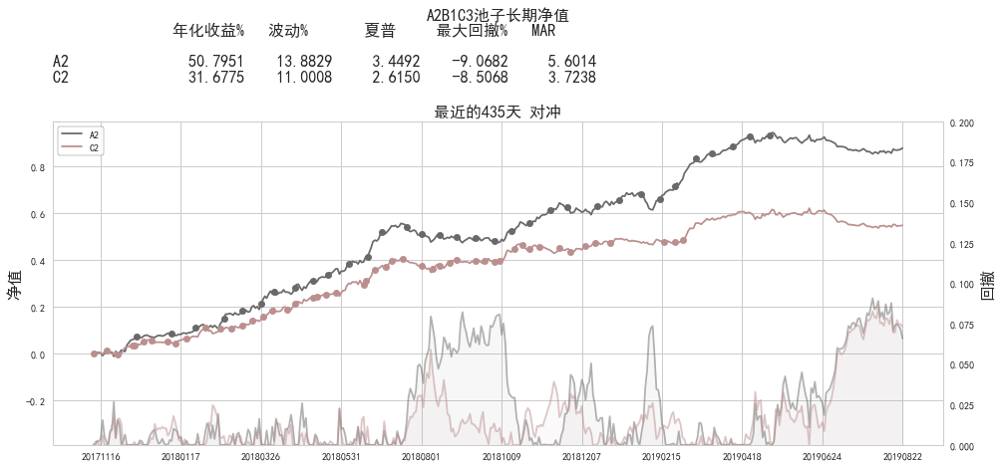

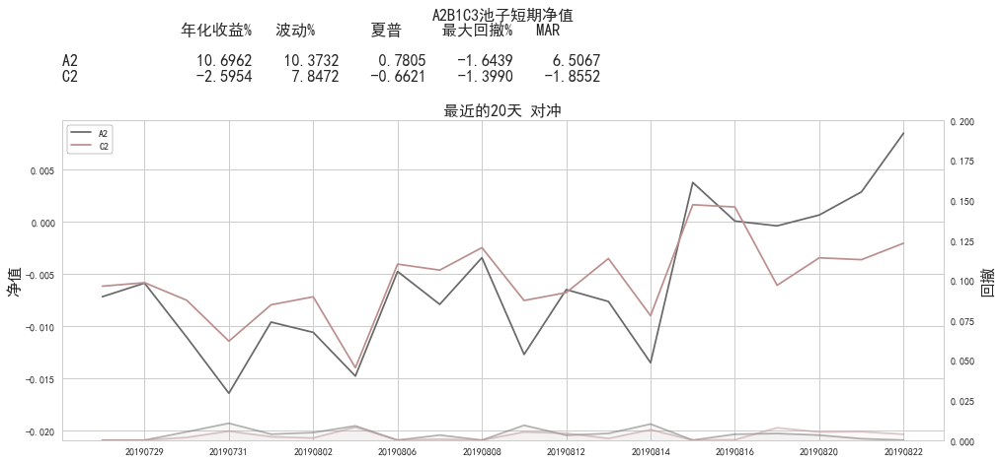

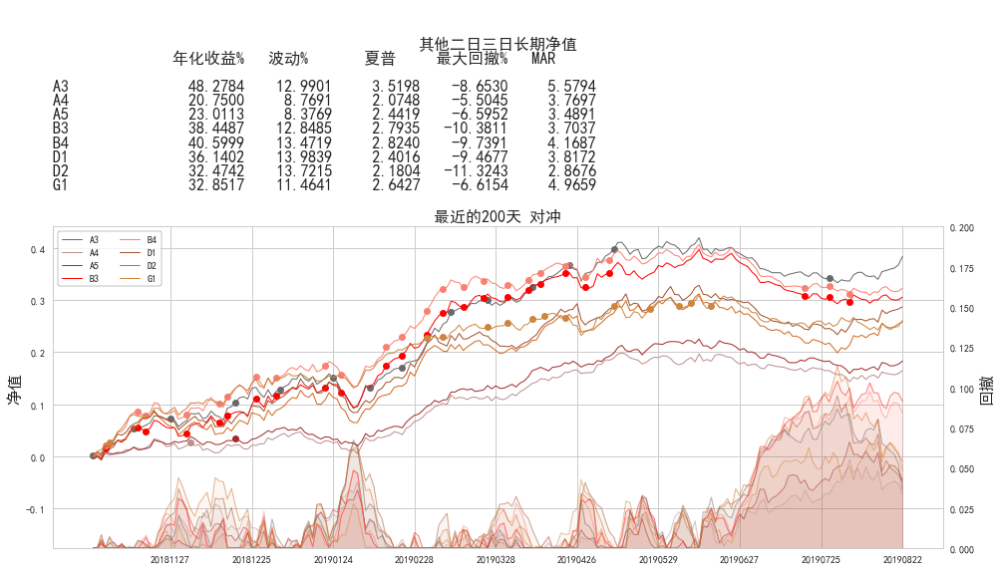

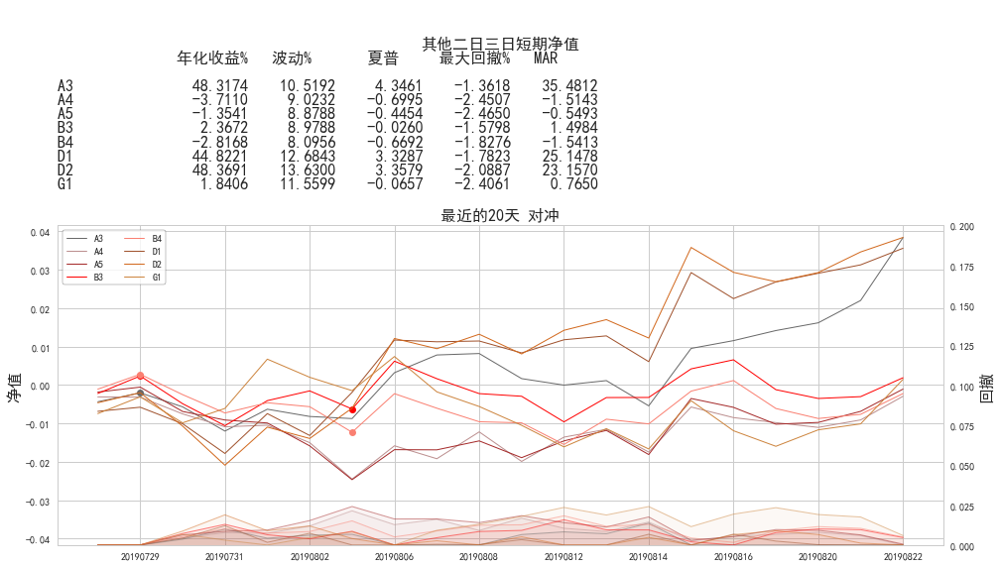

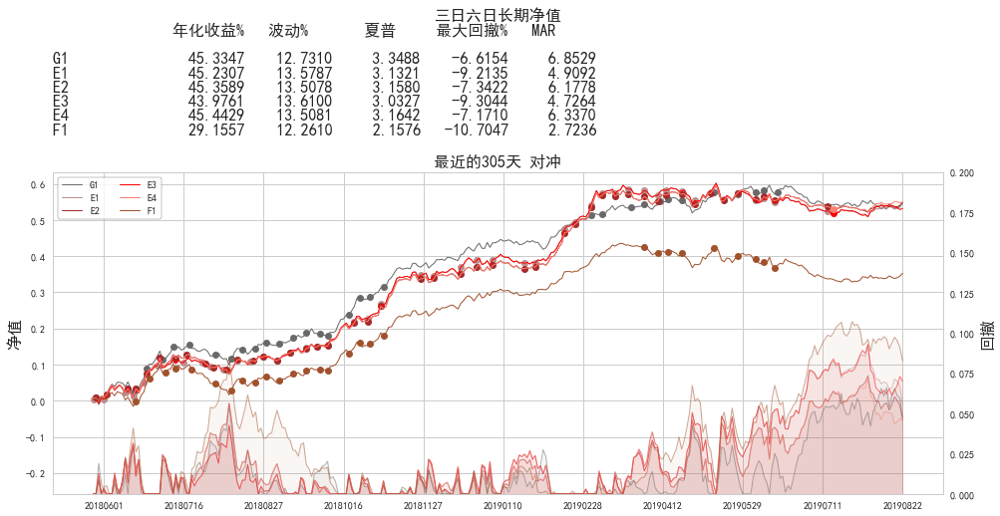

...

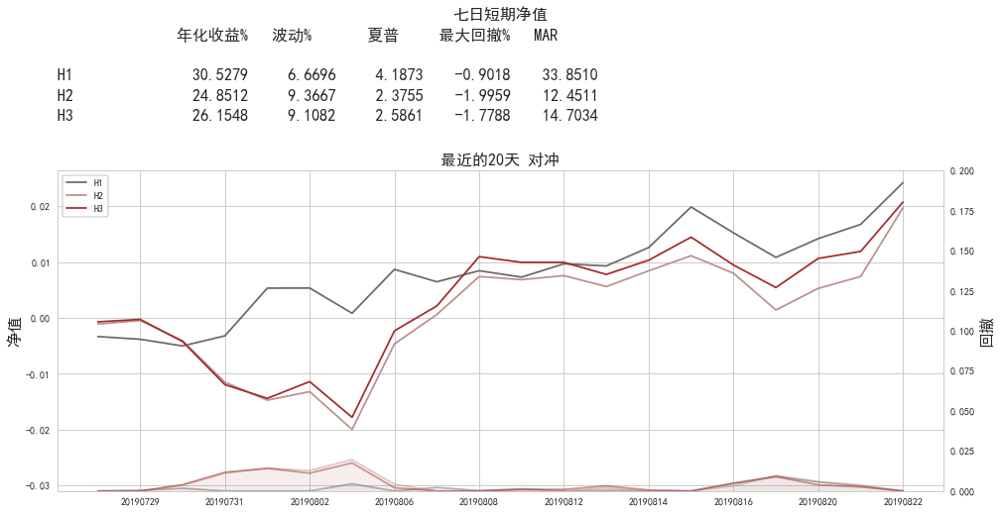

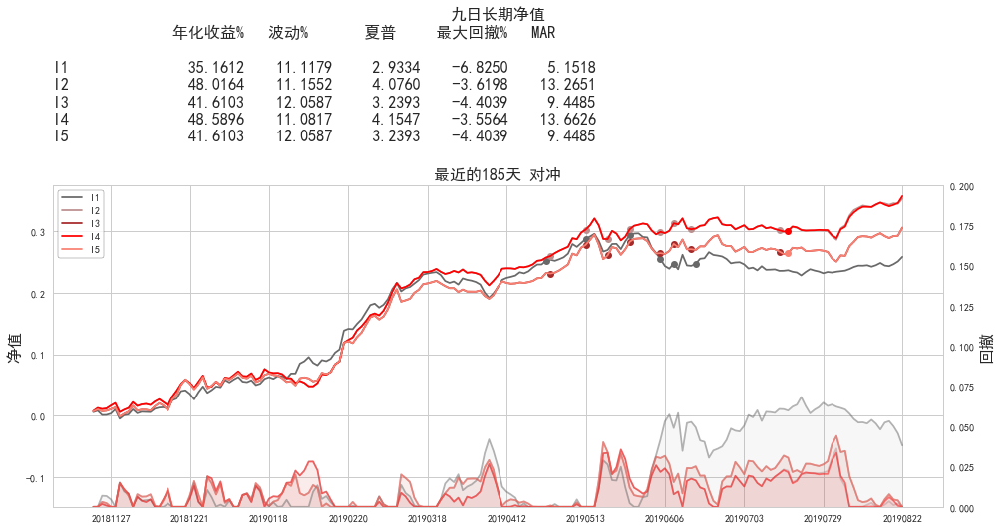

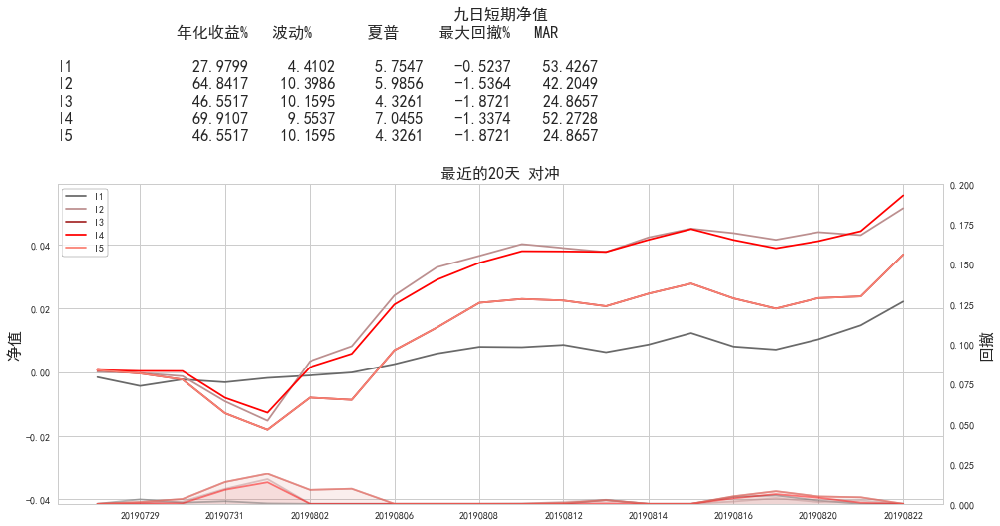

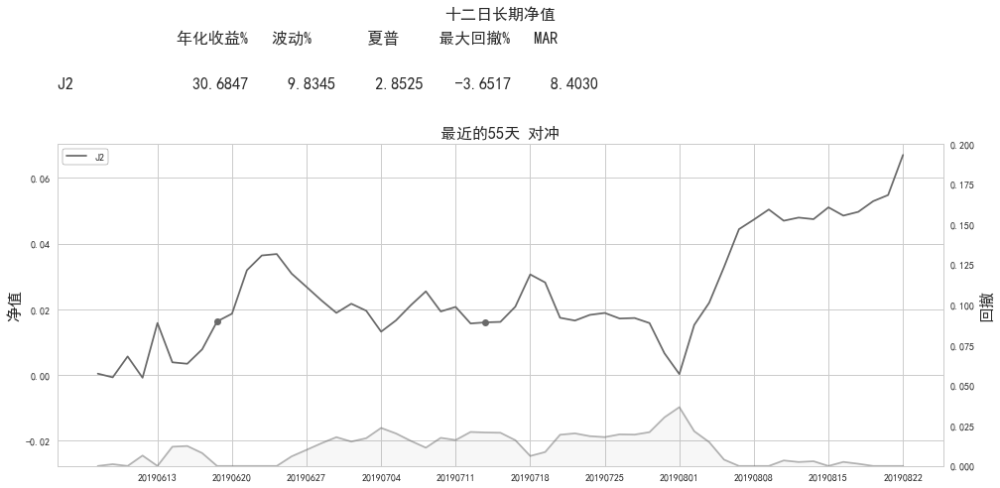

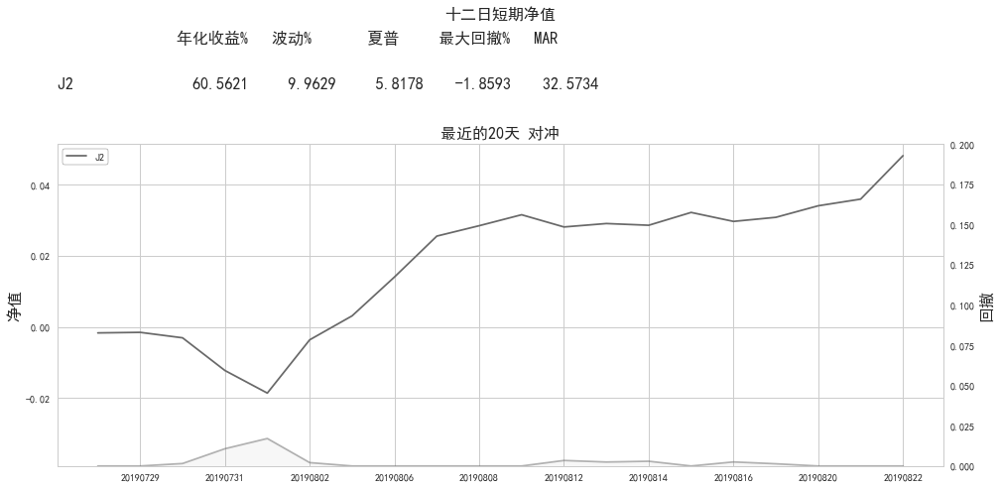

In [18]:
general_plot(file_list = ['回测_2_(A2)_5000万_7_50支.xlsx', '回测_2_(C2)_5000万_7_50支.xlsx'], \
             step = 5, shorted_label = 1, save = ['A2B1C3池子长期净值'])
general_plot(file_list = ['回测_2_(A2)_5000万_7_50支.xlsx', '回测_2_(C2)_5000万_7_50支.xlsx'], \
             length_list = 20, shorted_label = 1, save = ['A2B1C3池子短期净值'])
general_plot(file_list = ['回测_2_(A3)_5000万_7_50支.xlsx', '回测_2_(A4)_5000万_7_50支.xlsx', '回测_2_(A5)_5000万_7_50支.xlsx', \
                          '回测_2_(B3)_5000万_7_50支.xlsx', '回测_2_(B4)_5000万_7_50支.xlsx', \
                          '回测_2_(D1)_5000万_7_50支.xlsx', '回测_2_(D2)_5000万_7_50支.xlsx', '回测_3_(G1)_5000万_7_50支.xlsx'], \
             step = 5, shorted_label = 1, save = ['其他二日三日长期净值'])
general_plot(file_list = ['回测_2_(A3)_5000万_7_50支.xlsx', '回测_2_(A4)_5000万_7_50支.xlsx', '回测_2_(A5)_5000万_7_50支.xlsx', \
                          '回测_2_(B3)_5000万_7_50支.xlsx', '回测_2_(B4)_5000万_7_50支.xlsx', \
                          '回测_2_(D1)_5000万_7_50支.xlsx', '回测_2_(D2)_5000万_7_50支.xlsx', '回测_3_(G1)_5000万_7_50支.xlsx'], \
             length_list = 20, shorted_label = 1, save = ['其他二日三日短期净值'])
general_plot(file_list = ['回测_3_(G1)_5000万_7_50支.xlsx', '回测_6_(E1)_5000万_7_50支.xlsx', '回测_6_(E2)_5000万_7_50支.xlsx', \
                          '回测_6_(E3)_5000万_7_50支.xlsx', '回测_6_(E4)_5000万_7_50支.xlsx', '回测_6_(F1)_5000万_7_50支.xlsx'], \
             step = 5, shorted_label = 1, save = ['三日六日长期净值'])
general_plot(file_list = ['回测_3_(G1)_5000万_7_50支.xlsx', '回测_6_(E1)_5000万_7_50支.xlsx', '回测_6_(E2)_5000万_7_50支.xlsx', \
                          '回测_6_(E3)_5000万_7_50支.xlsx', '回测_6_(E4)_5000万_7_50支.xlsx', '回测_6_(F1)_5000万_7_50支.xlsx'], \
             length_list = 20, shorted_label = 1, save = ['三日六日短期净值'])
general_plot(file_list = ['回测_7_(H1)_5000万_7_50支.xlsx', '回测_7_(H2)_5000万_7_50支.xlsx', '回测_7_(H3)_5000万_7_50支.xlsx', ], \
             step = 5, shorted_label = 1, save = ['七日长期净值'])
general_plot(file_list = ['回测_7_(H1)_5000万_7_50支.xlsx', '回测_7_(H2)_5000万_7_50支.xlsx', '回测_7_(H3)_5000万_7_50支.xlsx', ], \
             length_list = 20, shorted_label = 1, save = ['七日短期净值'])
general_plot(file_list = ['回测_9_(I1)_5000万_7_50支.xlsx', '回测_9_(I2)_5000万_7_50支.xlsx', '回测_9_(I3)_5000万_7_50支.xlsx', \
                          '回测_9_(I4)_5000万_7_50支.xlsx', '回测_9_(I5)_5000万_7_50支.xlsx',], \
             step = 5, shorted_label = 1, save = ['九日长期净值'])
general_plot(file_list = ['回测_9_(I1)_5000万_7_50支.xlsx', '回测_9_(I2)_5000万_7_50支.xlsx', '回测_9_(I3)_5000万_7_50支.xlsx', \
                          '回测_9_(I4)_5000万_7_50支.xlsx', '回测_9_(I5)_5000万_7_50支.xlsx', ], \
             length_list = 20, shorted_label = 1, save = ['九日短期净值'])
general_plot(file_list = ['回测_12_(J2)_5000万_7_50支.xlsx', ], \
             step = 5, shorted_label = 1, save = ['十二日长期净值'])
general_plot(file_list = ['回测_12_(J2)_5000万_7_50支.xlsx', ], \
             length_list = 20, shorted_label = 1, save = ['十二日短期净值'])

# 从0开始

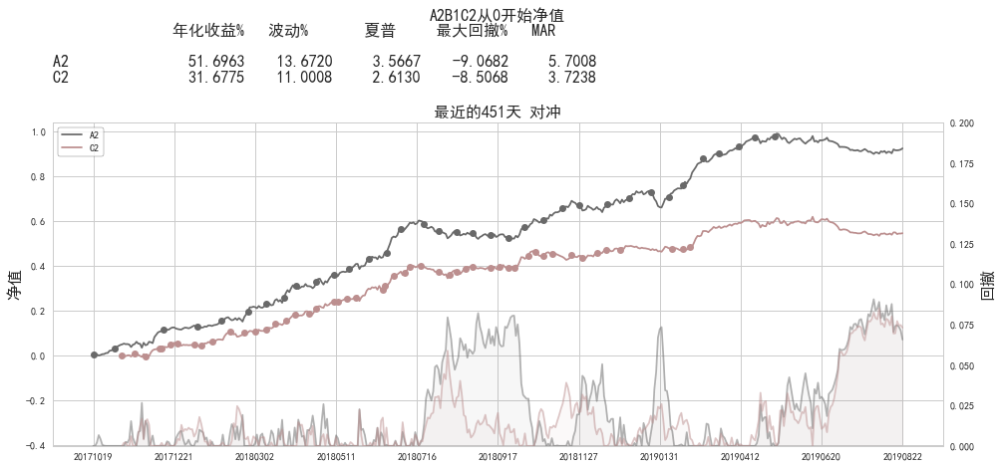

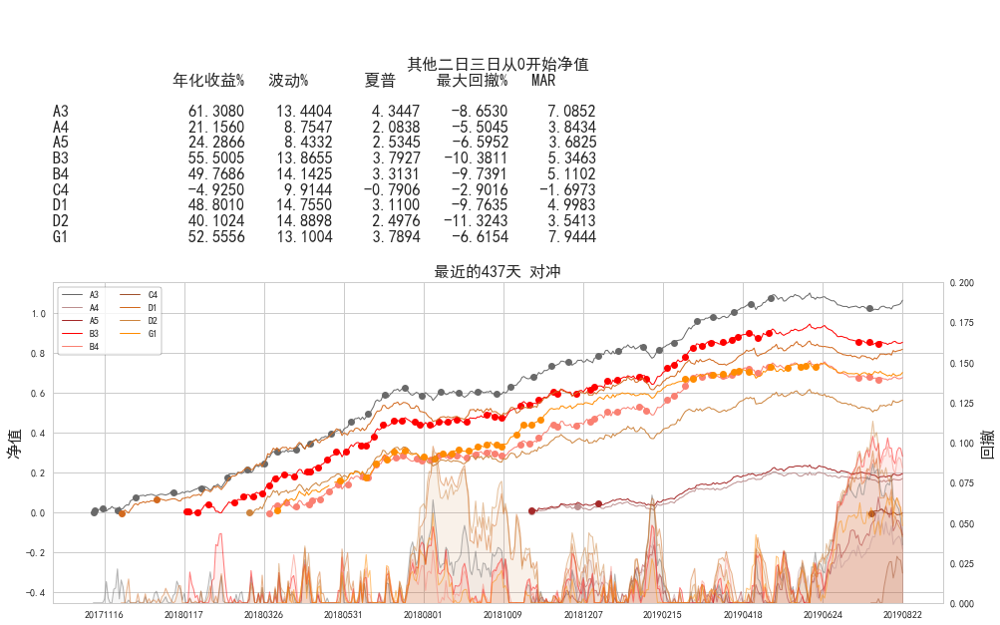

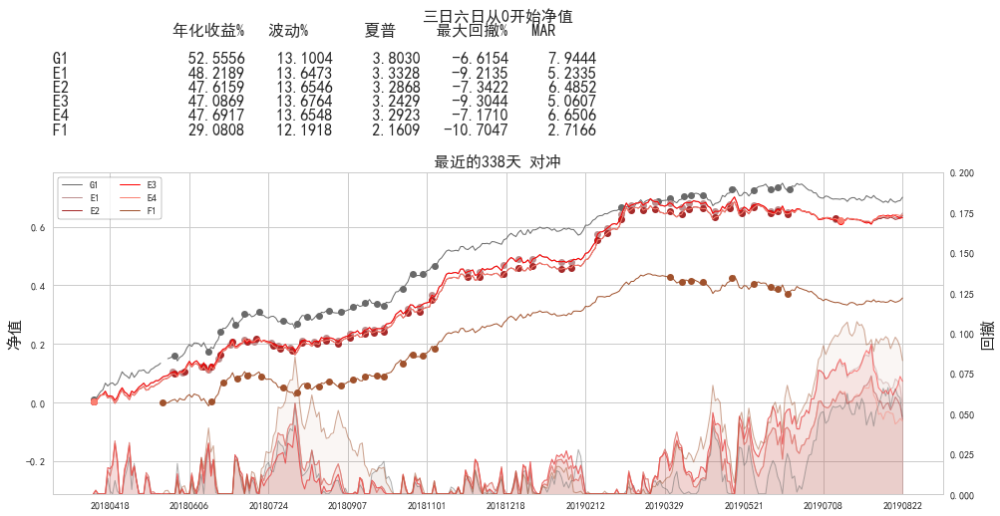

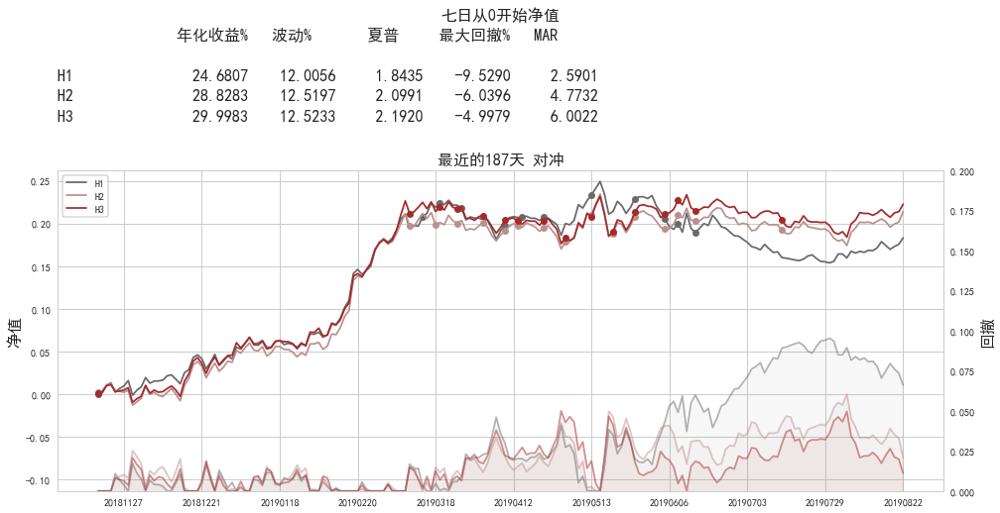

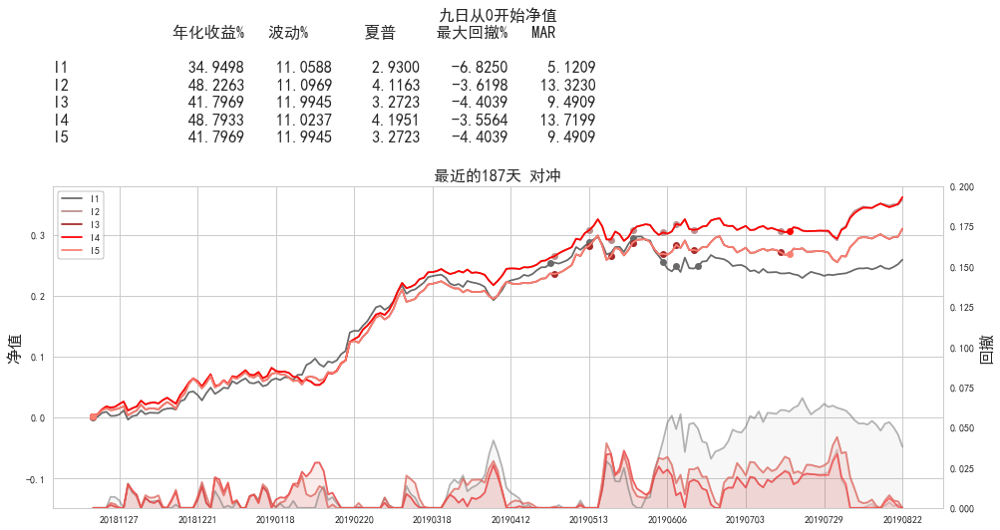

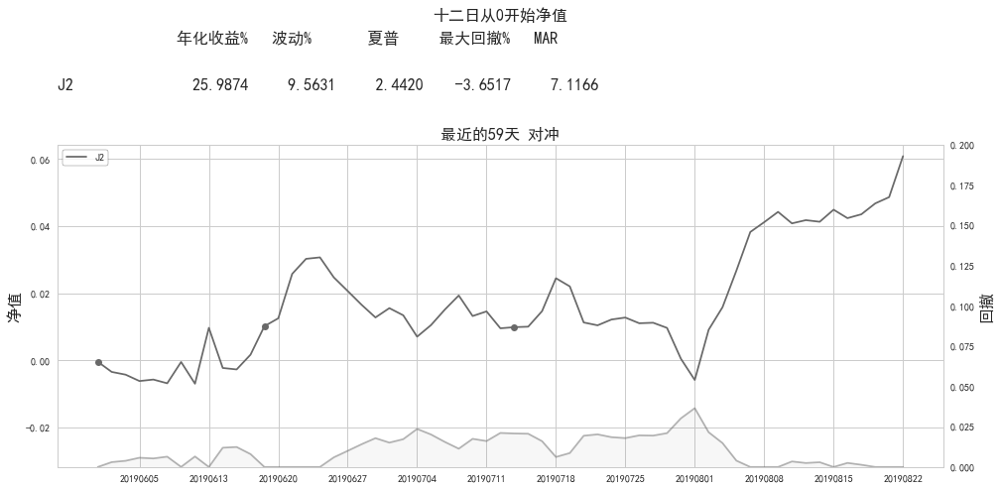

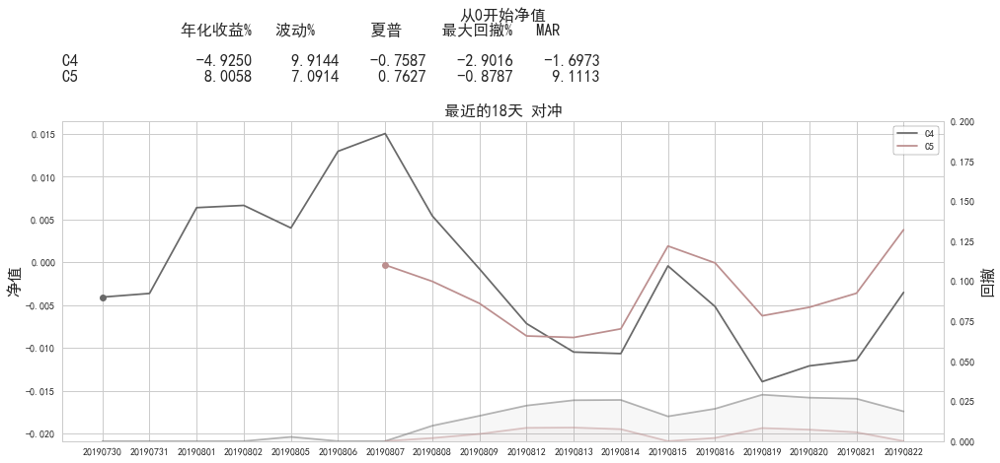

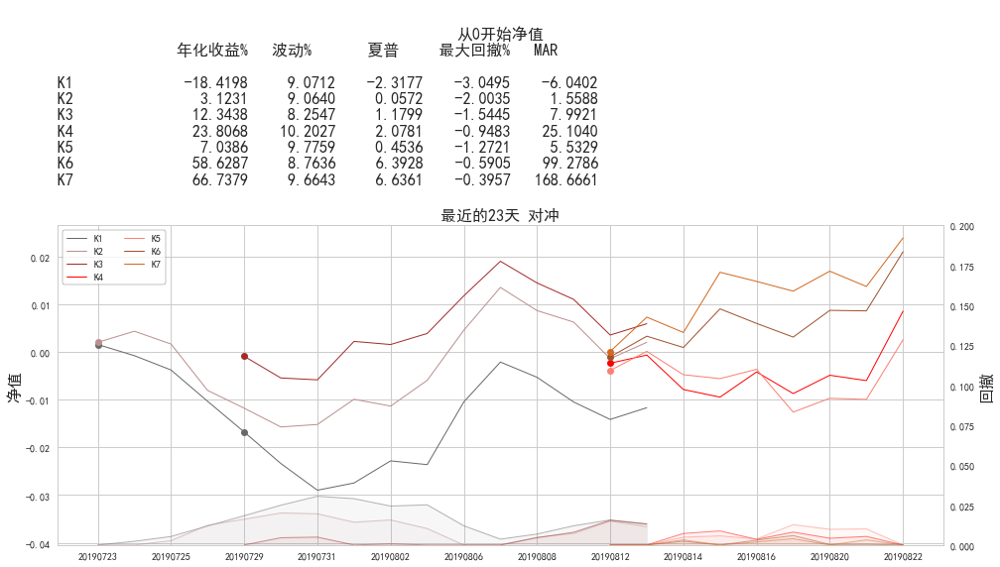

In [19]:
general_plot(file_list = ['回测_2_(A2)_5000万_7_50支.xlsx', '回测_2_(C2)_5000万_7_50支.xlsx'], \
             start_together = 1, shorted_label = 1, save = ['A2B1C2从0开始净值'])
general_plot(file_list = ['回测_2_(A3)_5000万_7_50支.xlsx', '回测_2_(A4)_5000万_7_50支.xlsx', '回测_2_(A5)_5000万_7_50支.xlsx', \
                          '回测_2_(B3)_5000万_7_50支.xlsx', '回测_2_(B4)_5000万_7_50支.xlsx', '回测_2_(C4)_5000万_7_50支.xlsx', \
                          '回测_2_(D1)_5000万_7_50支.xlsx', '回测_2_(D2)_5000万_7_50支.xlsx', '回测_3_(G1)_5000万_7_50支.xlsx'], \
             start_together = 1, shorted_label = 1, save = ['其他二日三日从0开始净值'])
general_plot(file_list = ['回测_3_(G1)_5000万_7_50支.xlsx', '回测_6_(E1)_5000万_7_50支.xlsx', '回测_6_(E2)_5000万_7_50支.xlsx', \
                          '回测_6_(E3)_5000万_7_50支.xlsx', '回测_6_(E4)_5000万_7_50支.xlsx', '回测_6_(F1)_5000万_7_50支.xlsx'], \
             start_together = 1, shorted_label = 1, save = ['三日六日从0开始净值'])
general_plot(file_list = ['回测_7_(H1)_5000万_7_50支.xlsx', '回测_7_(H2)_5000万_7_50支.xlsx', '回测_7_(H3)_5000万_7_50支.xlsx'], \
             start_together = 1, shorted_label = 1, save = ['七日从0开始净值'])
general_plot(file_list = ['回测_9_(I1)_5000万_7_50支.xlsx', '回测_9_(I2)_5000万_7_50支.xlsx', '回测_9_(I3)_5000万_7_50支.xlsx', \
                          '回测_9_(I4)_5000万_7_50支.xlsx', '回测_9_(I5)_5000万_7_50支.xlsx', ], \
             start_together = 1, shorted_label = 1, save = ['九日从0开始净值'])
general_plot(file_list = ['回测_12_(J2)_5000万_7_50支.xlsx', ], \
             start_together = 1, shorted_label = 1, save = ['十二日从0开始净值'])
general_plot(file_list = ['回测_2_(C4)_5000万_7_50支.xlsx', '回测_2_(C5)_5000万_7_50支.xlsx', ], \
             start_together = 1, shorted_label = 1, save = ['从0开始净值'])
general_plot(file_list = ['回测_2_(K1)_5000万_7_50支.xlsx', '回测_2_(K2)_5000万_7_50支.xlsx', '回测_2_(K3)_5000万_7_50支.xlsx', \
                          '回测_2_(K4)_5000万_7_50支.xlsx', '回测_2_(K5)_5000万_7_50支.xlsx', '回测_2_(K6)_5000万_7_50支.xlsx', \
                          '回测_2_(K7)_5000万_7_50支.xlsx', ], \
             start_together = 1, shorted_label = 1, save = ['从0开始净值'])

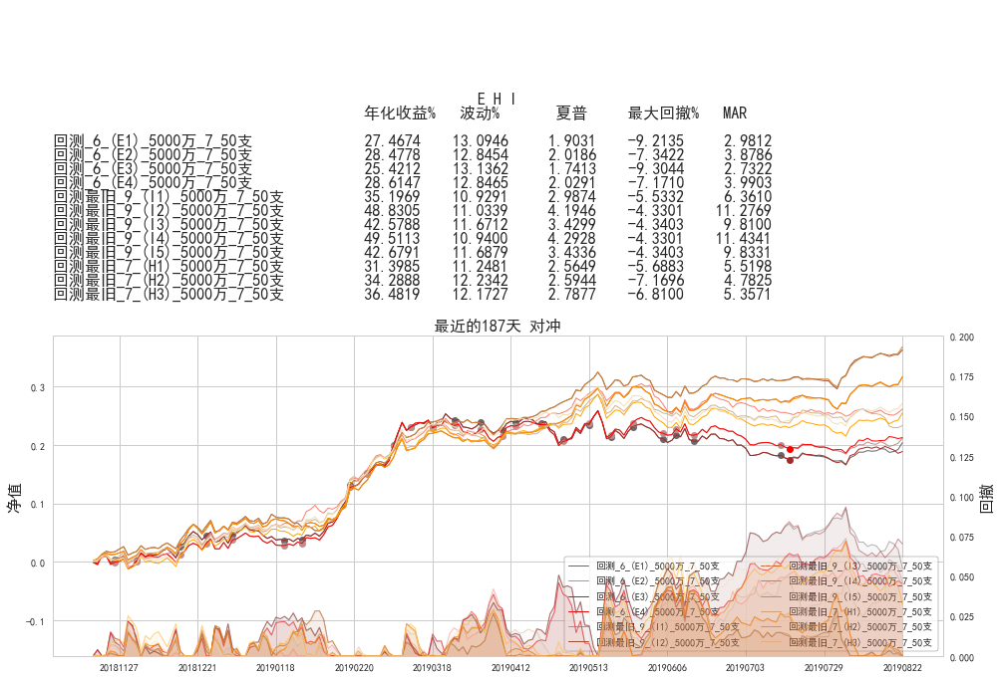

In [20]:
general_plot(file_list = ['回测_6_(E1)_5000万_7_50支.xlsx', '回测_6_(E2)_5000万_7_50支.xlsx', \
                          '回测_6_(E3)_5000万_7_50支.xlsx', '回测_6_(E4)_5000万_7_50支.xlsx', \
                          '回测最旧_9_(I1)_5000万_7_50支.xlsx', '回测最旧_9_(I2)_5000万_7_50支.xlsx', '回测最旧_9_(I3)_5000万_7_50支.xlsx', \
                          '回测最旧_9_(I4)_5000万_7_50支.xlsx', '回测最旧_9_(I5)_5000万_7_50支.xlsx', \
                          '回测最旧_7_(H1)_5000万_7_50支.xlsx', '回测最旧_7_(H2)_5000万_7_50支.xlsx', '回测最旧_7_(H3)_5000万_7_50支.xlsx'], \
             start_together = 1, shorted_label = 0, start_date = 20181119, save = ['E H I'])

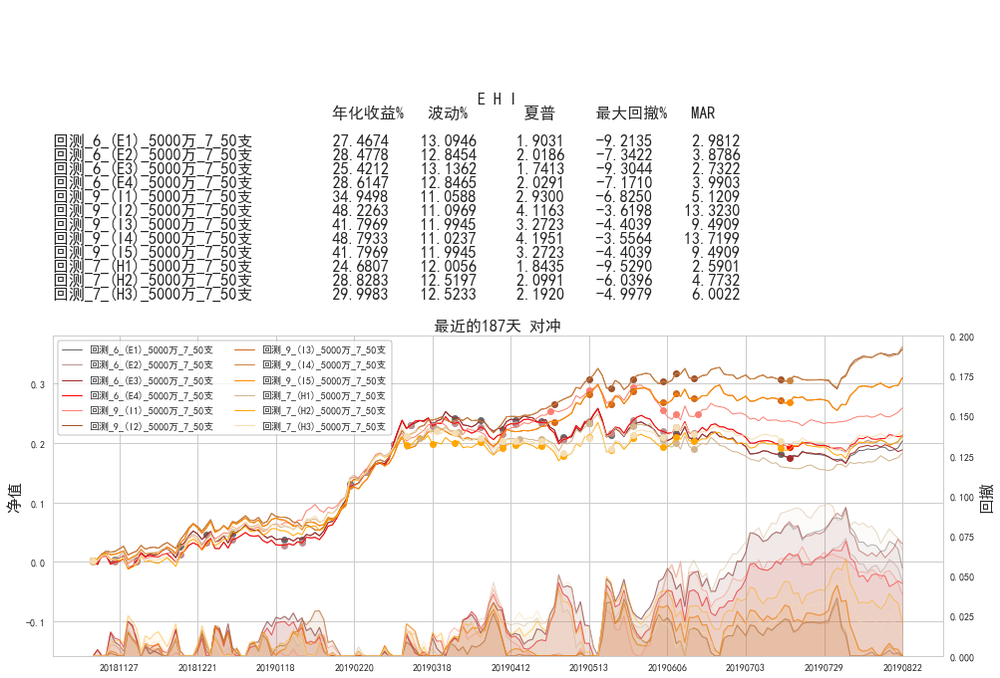

In [21]:
general_plot(file_list = ['回测_6_(E1)_5000万_7_50支.xlsx', '回测_6_(E2)_5000万_7_50支.xlsx', \
                          '回测_6_(E3)_5000万_7_50支.xlsx', '回测_6_(E4)_5000万_7_50支.xlsx', \
                          '回测_9_(I1)_5000万_7_50支.xlsx', '回测_9_(I2)_5000万_7_50支.xlsx', '回测_9_(I3)_5000万_7_50支.xlsx', \
                          '回测_9_(I4)_5000万_7_50支.xlsx', '回测_9_(I5)_5000万_7_50支.xlsx', \
                          '回测_7_(H1)_5000万_7_50支.xlsx', '回测_7_(H2)_5000万_7_50支.xlsx', '回测_7_(H3)_5000万_7_50支.xlsx'], \
             start_together = 1, shorted_label = 0, start_date = 20181119, save = ['E H I'])

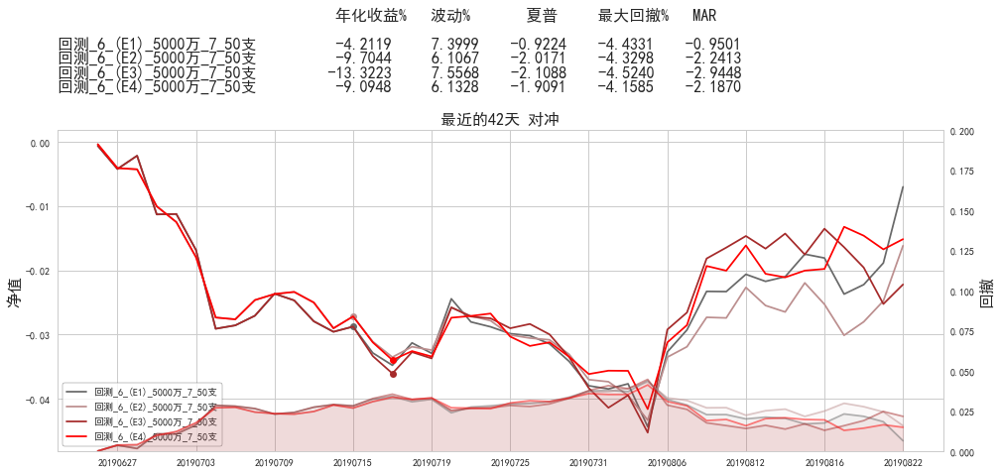

In [22]:
general_plot(file_list = ['回测_6_(E1)_5000万_7_50支.xlsx', '回测_6_(E2)_5000万_7_50支.xlsx', \
                          '回测_6_(E3)_5000万_7_50支.xlsx', '回测_6_(E4)_5000万_7_50支.xlsx', ], \
             start_together = 1, length_list = [42])

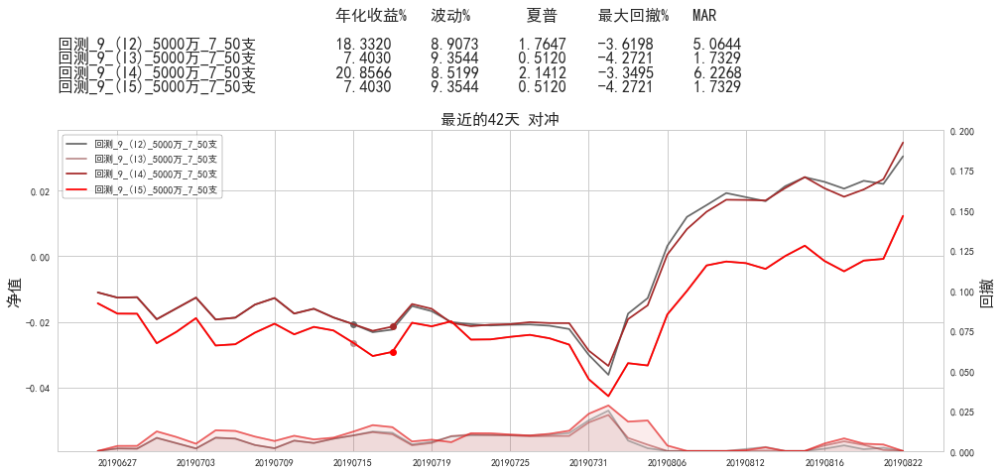

In [23]:
general_plot(file_list = ['回测_9_(I2)_5000万_7_50支.xlsx', '回测_9_(I3)_5000万_7_50支.xlsx', \
                          '回测_9_(I4)_5000万_7_50支.xlsx', '回测_9_(I5)_5000万_7_50支.xlsx', ], \
             start_together = 1, length_list = [42])

# 全模型

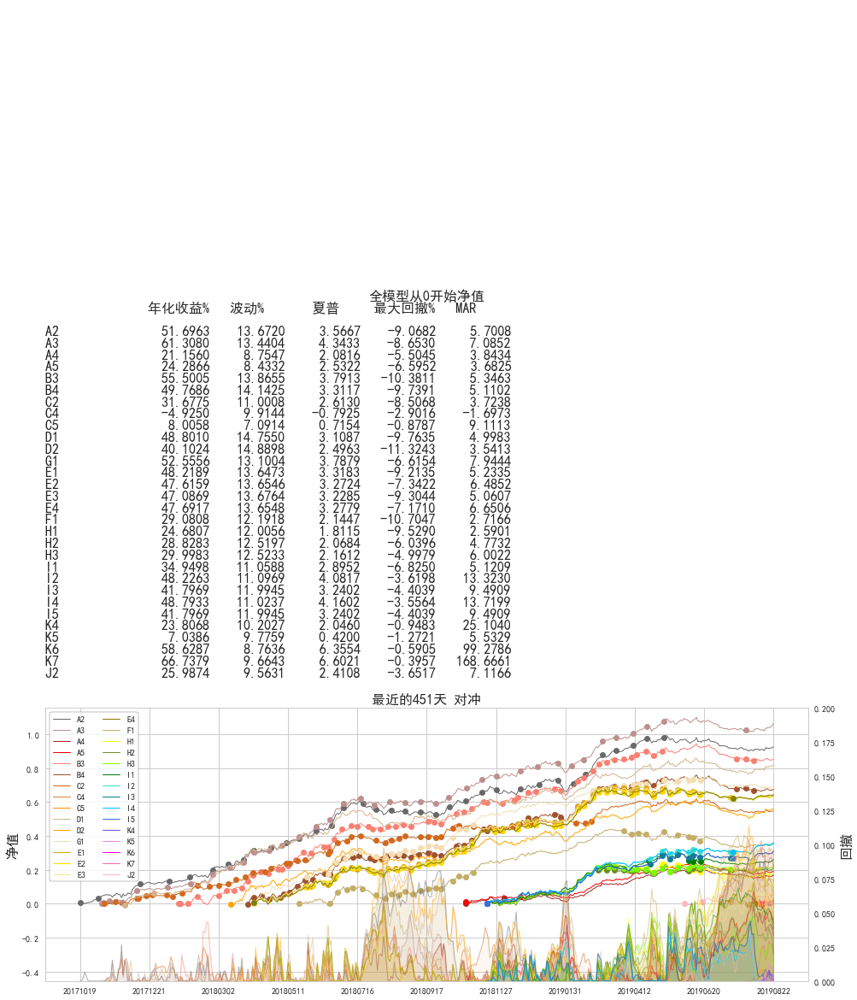

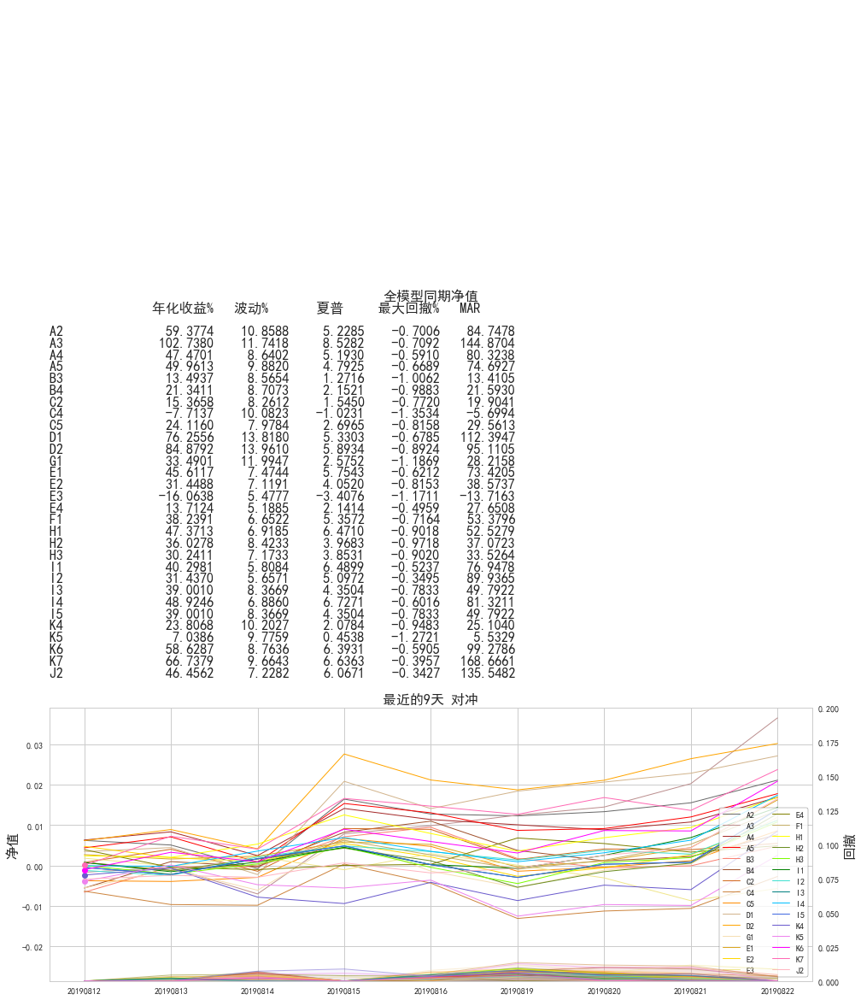

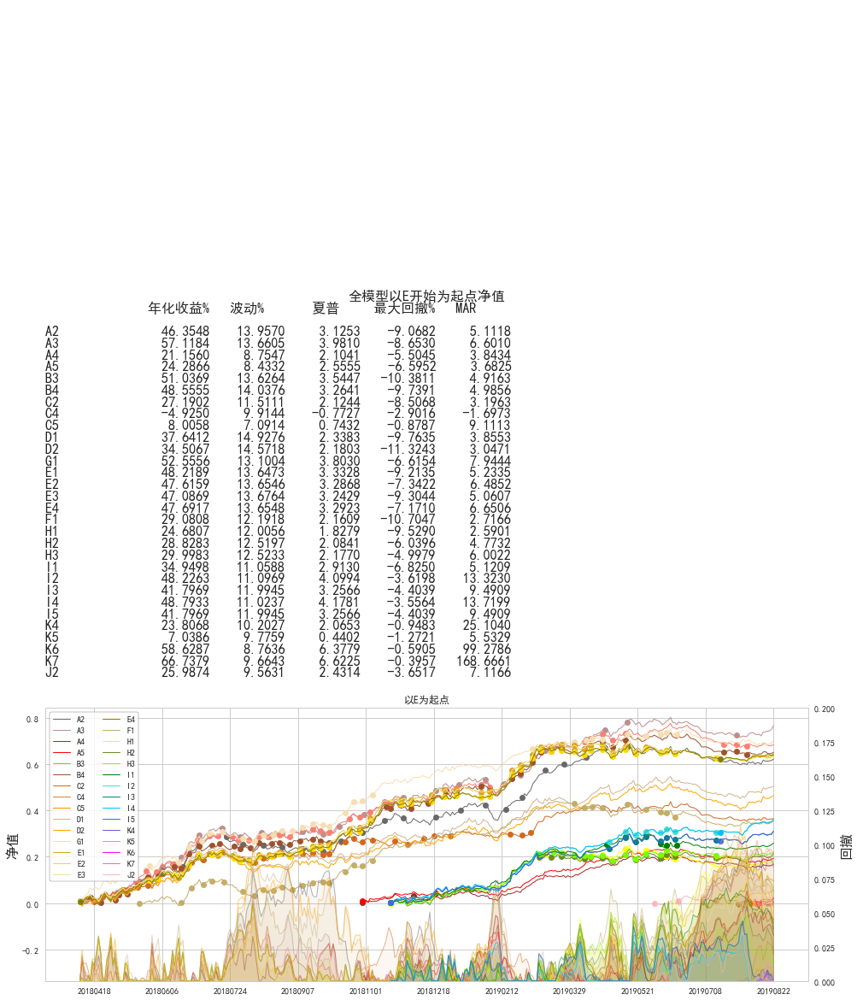

In [24]:
general_plot(file_list = files_last, start_together = 1, shorted_label = 1, save = ['全模型从0开始净值'])
general_plot(file_list = files_last, start_together = 0, shorted_label = 1, save = ['全模型同期净值'])
general_plot(file_list = files_last, start_together = 1, shorted_label = 1, start_date = 20180409, title = '以E为起点', \
             save = ['全模型以E开始为起点净值'])

# 各模型 正常5000万vs无限制vs最旧版vs市值行业

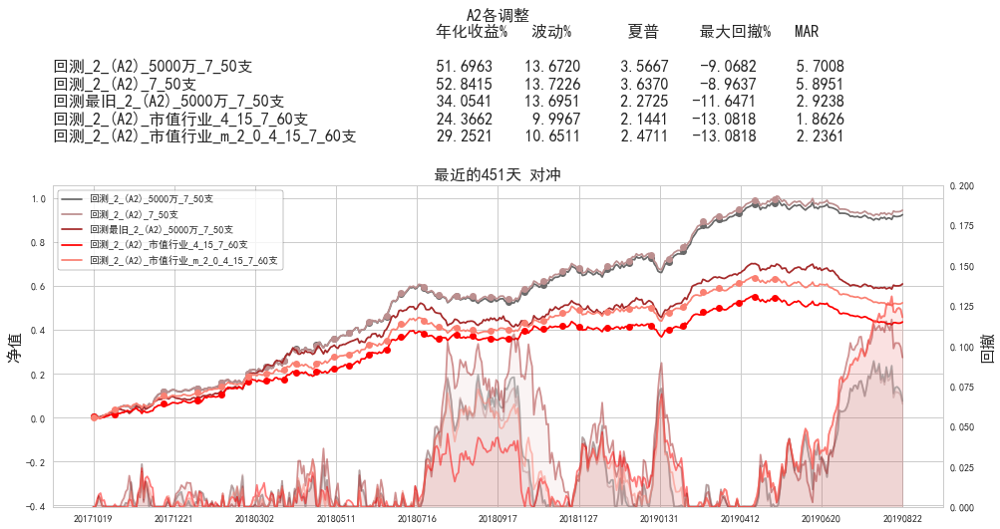

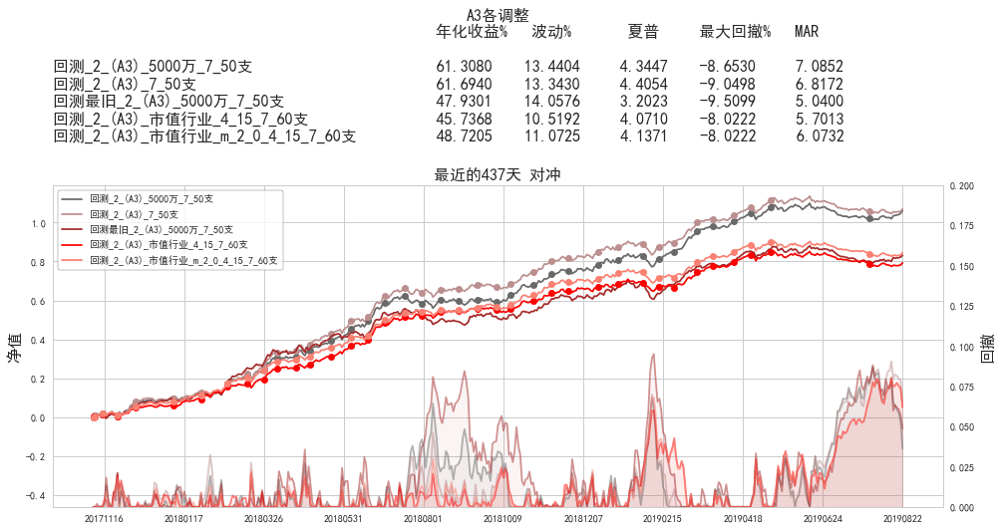

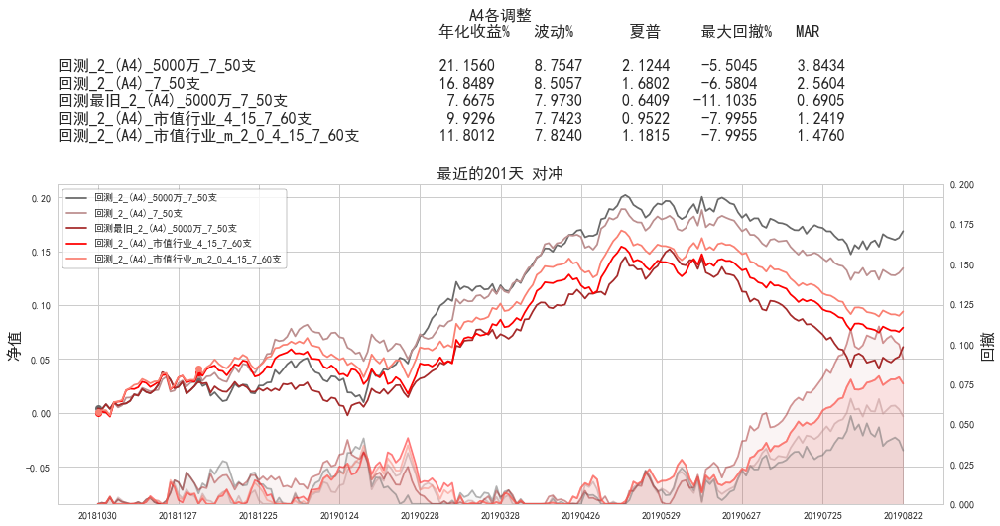

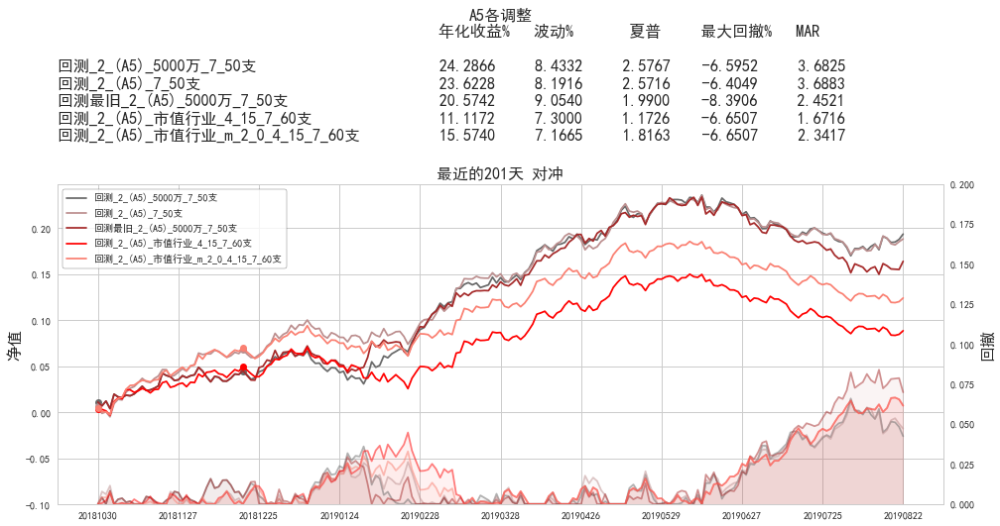

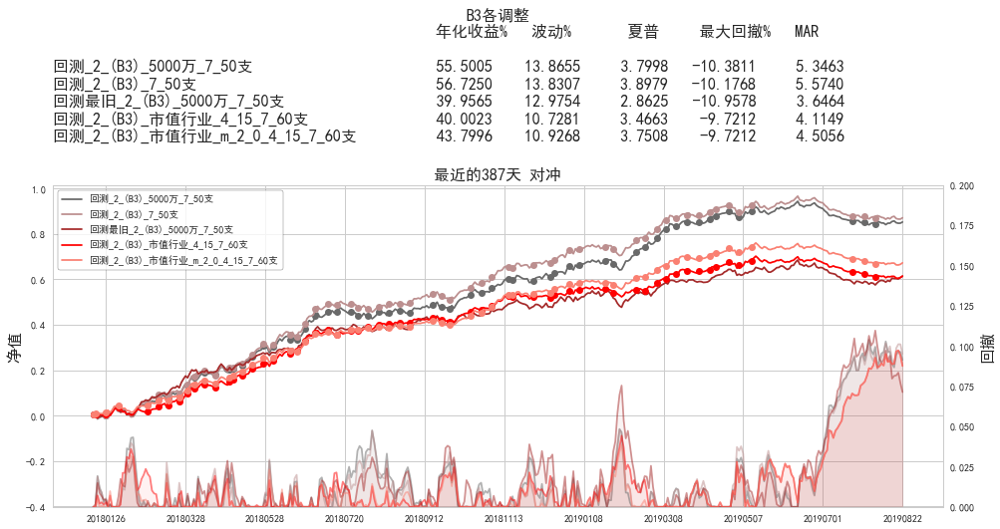

...

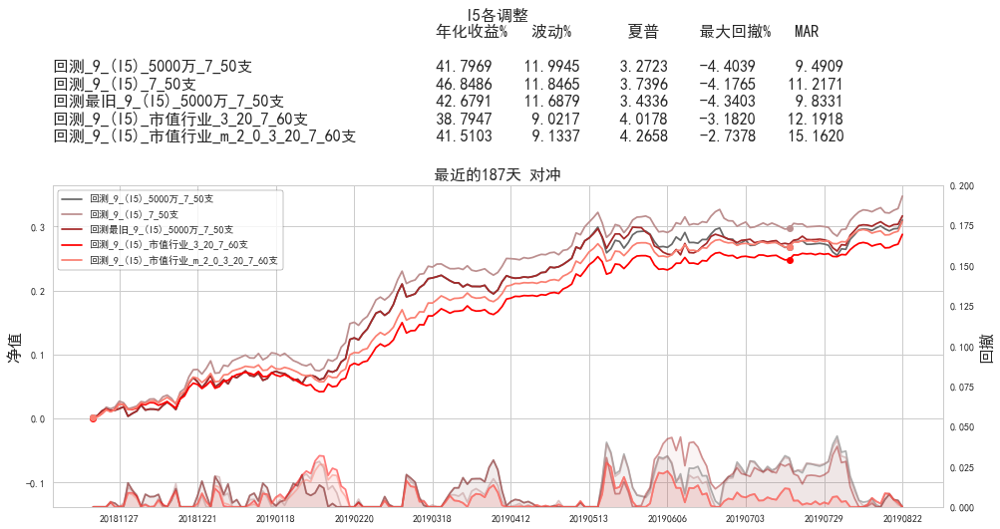

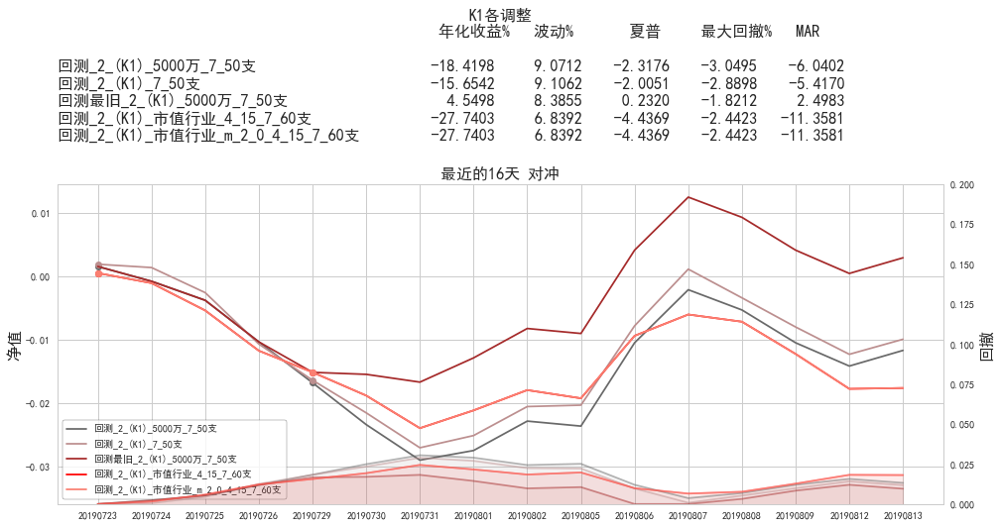

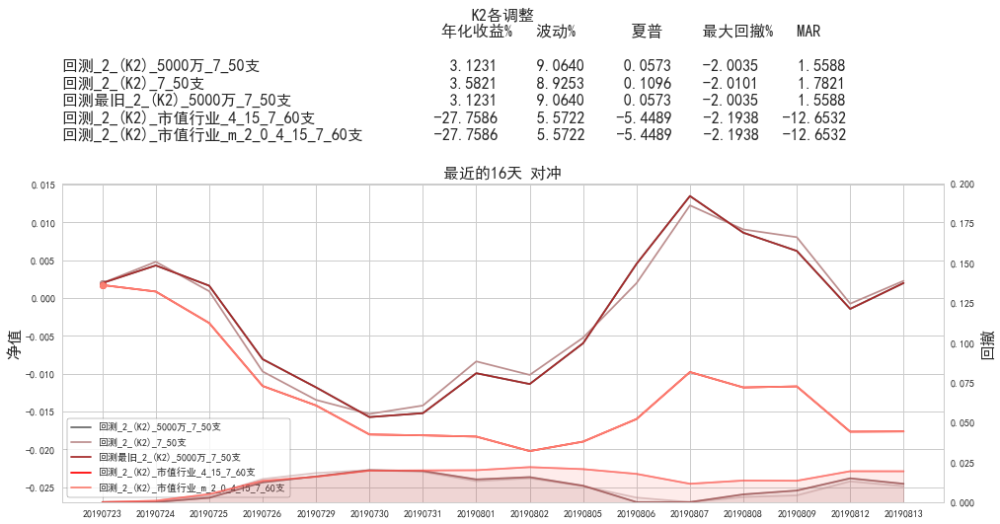

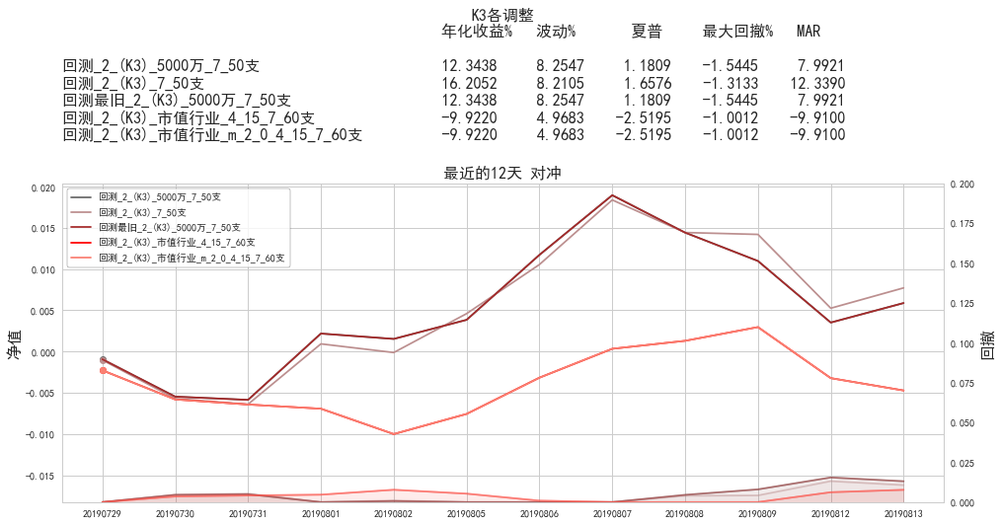

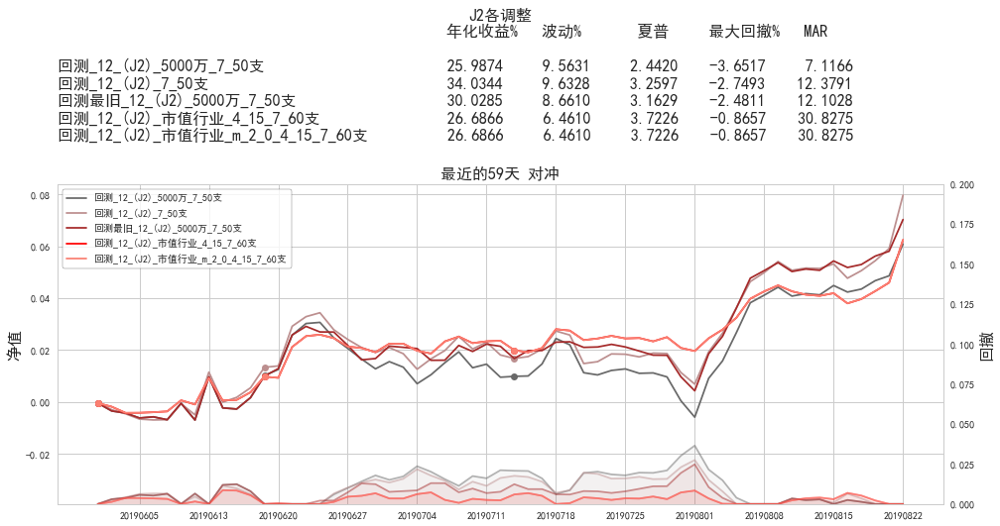

In [25]:
for current_model in ['A2', 'A3', 'A4', 'A5', 'B3', 'B4', 'C2', 'C4', 'D1', 'D2', 'G1', \
                      'E1', 'E2', 'E3', 'E4', 'F1', 'H1', 'H2', 'H3', 'I1', 'I2', 'I3', \
                      'I4', 'I5', 'K1', 'K2', 'K3', 'J2']:
    universe = str(preset_hold_days(current_model))
    if current_model[0] == 'H' or current_model[0] == 'I':
        general_plot(file_list = ['回测_'+universe+'_('+current_model+')_5000万_7_50支.xlsx',\
                                  '回测_'+universe+'_('+current_model+')_7_50支.xlsx',\
                                  '回测最旧_'+universe+'_('+current_model+')_5000万_7_50支.xlsx',\
                                  '回测_'+universe+'_('+current_model+')_市值行业_3_20_7_60支.xlsx', \
                                  '回测_'+universe+'_('+current_model+')_市值行业_m_2_0_3_20_7_60支.xlsx'], save = [current_model+'各调整'])
    else:
        general_plot(file_list = ['回测_'+universe+'_('+current_model+')_5000万_7_50支.xlsx',\
                                  '回测_'+universe+'_('+current_model+')_7_50支.xlsx',\
                                  '回测最旧_'+universe+'_('+current_model+')_5000万_7_50支.xlsx',\
                                  '回测_'+universe+'_('+current_model+')_市值行业_4_15_7_60支.xlsx', \
                                  '回测_'+universe+'_('+current_model+')_市值行业_m_2_0_4_15_7_60支.xlsx'], save = [current_model+'各调整'])

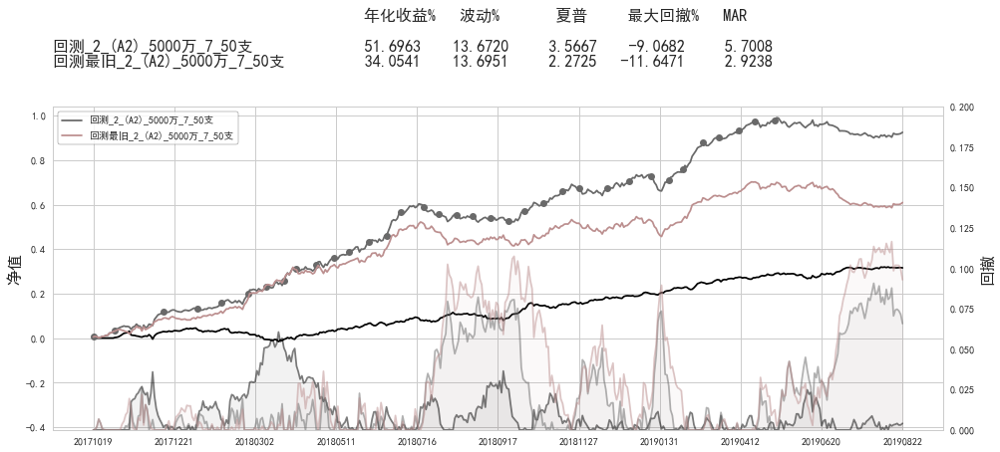

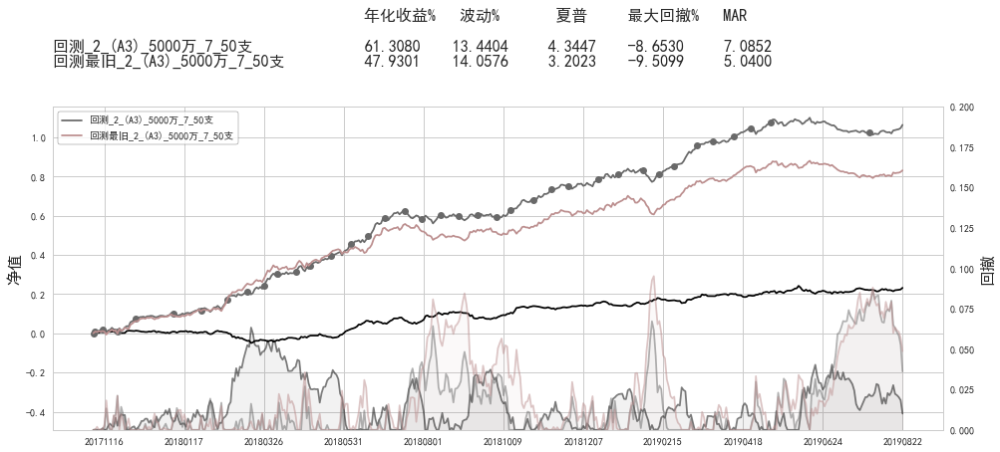

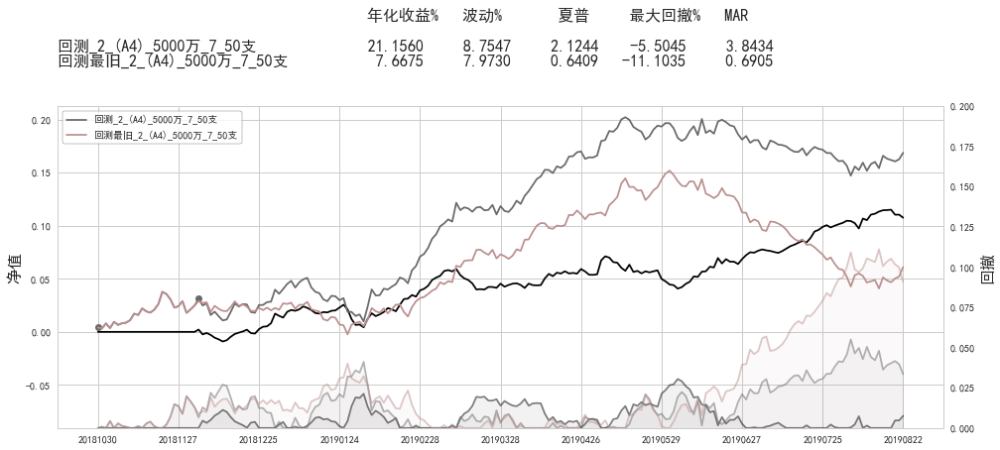

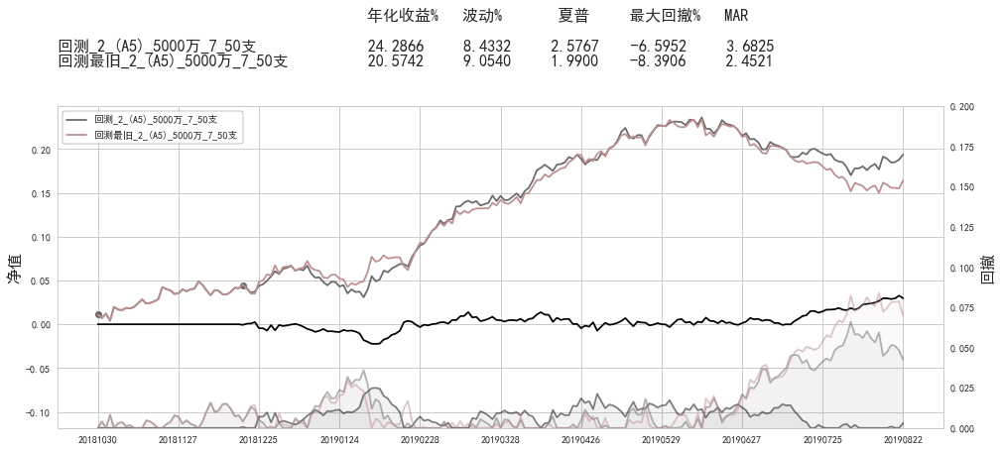

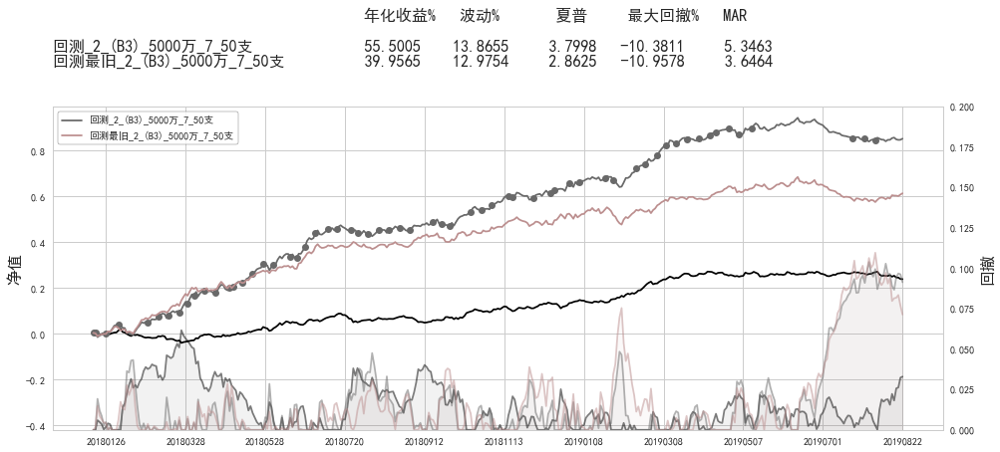

...

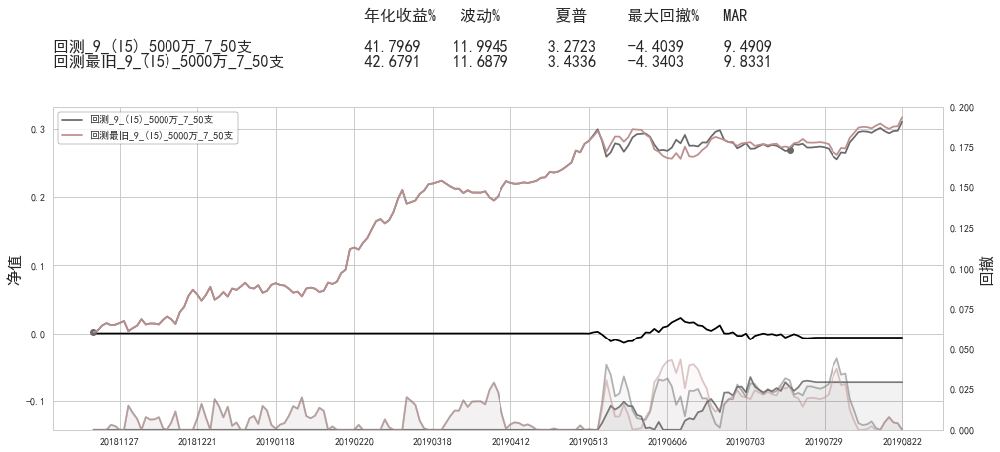

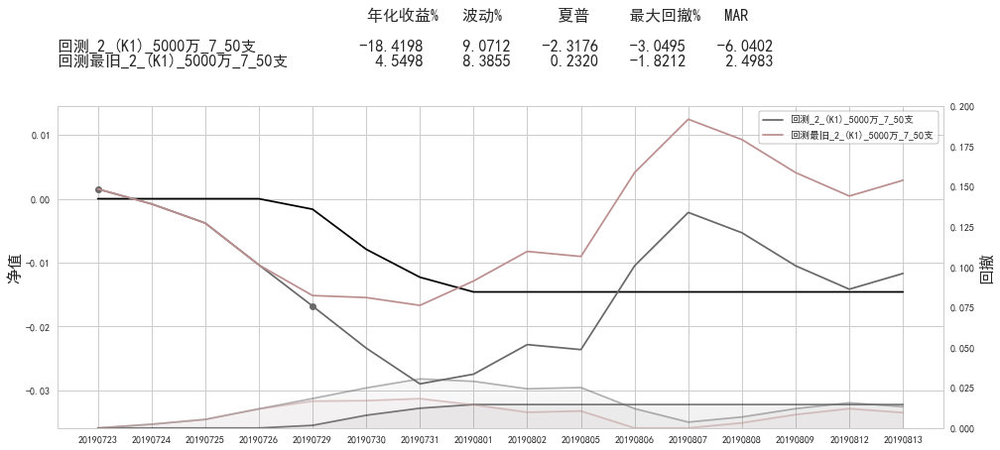

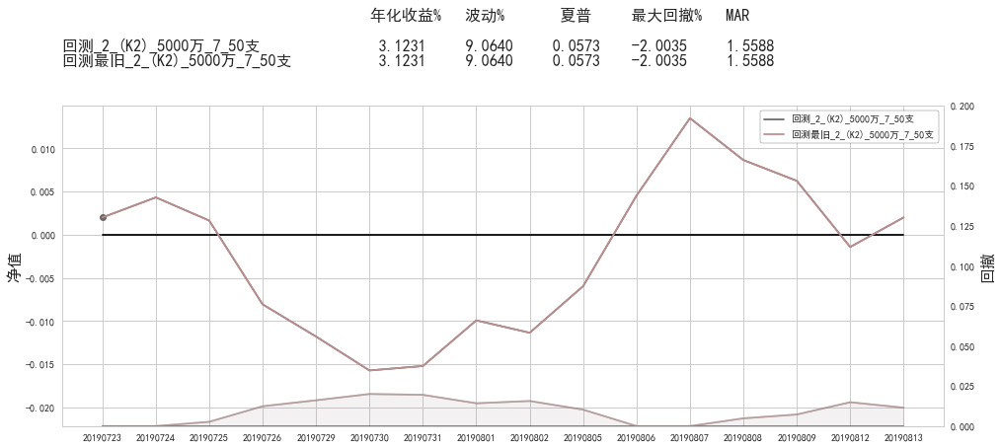

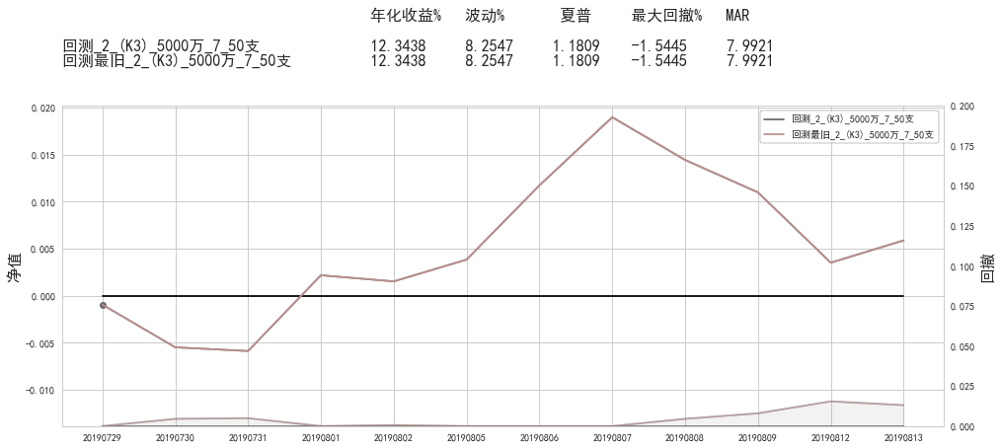

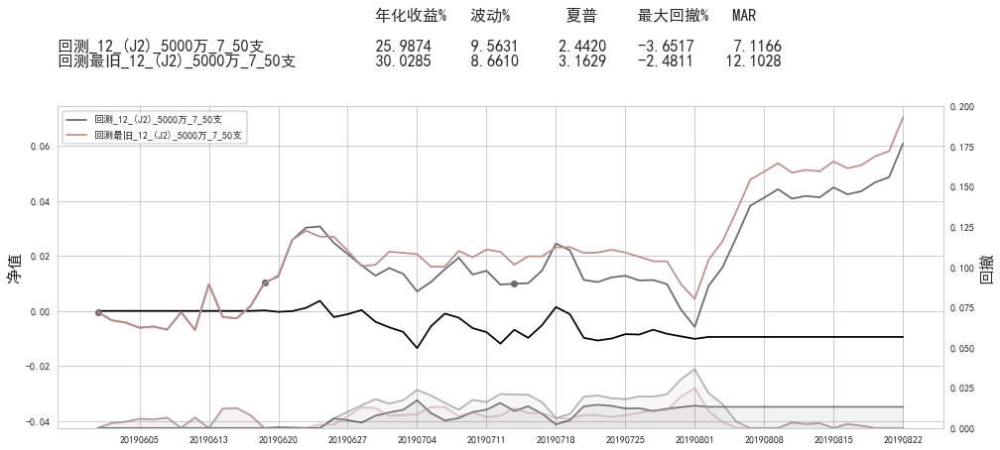

In [26]:
for current_model in ['A2', 'A3', 'A4', 'A5', 'B3', 'B4', 'C2', 'C4', 'D1', 'D2', 'G1', \
                      'E1', 'E2', 'E3', 'E4', 'F1', 'H1', 'H2', 'H3', 'I1', 'I2', 'I3', \
                      'I4', 'I5', 'K1', 'K2', 'K3', 'J2']:
    universe = str(preset_hold_days(current_model))
    general_plot(file_list = ['回测_'+universe+'_('+current_model+')_5000万_7_50支.xlsx', \
                              '回测最旧_'+universe+'_('+current_model+')_5000万_7_50支.xlsx',], \
                 start_together = 1,title=' ',substract=1)

# 正在使用

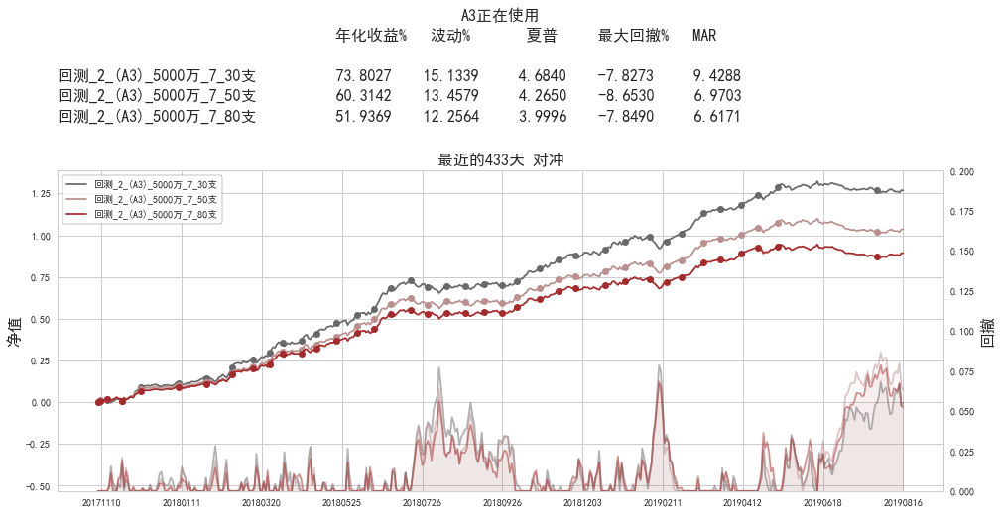

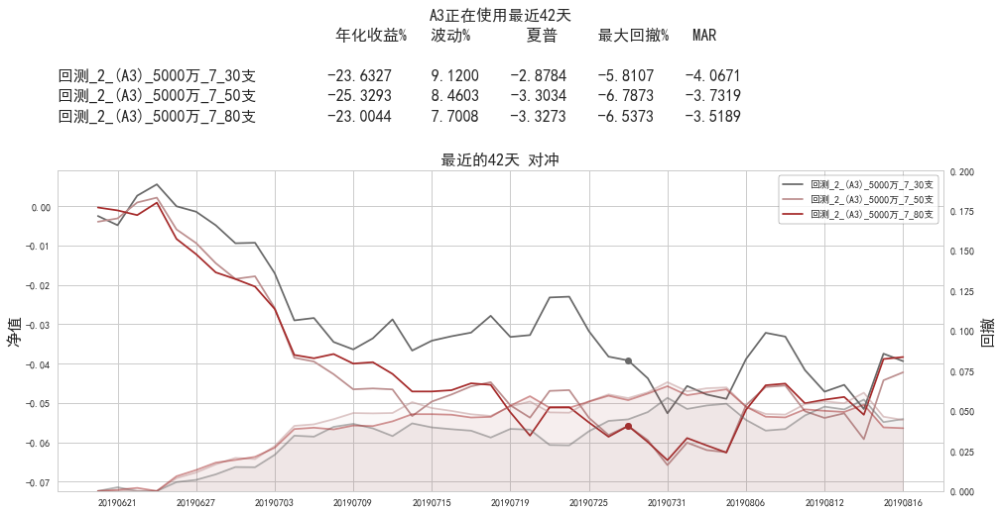

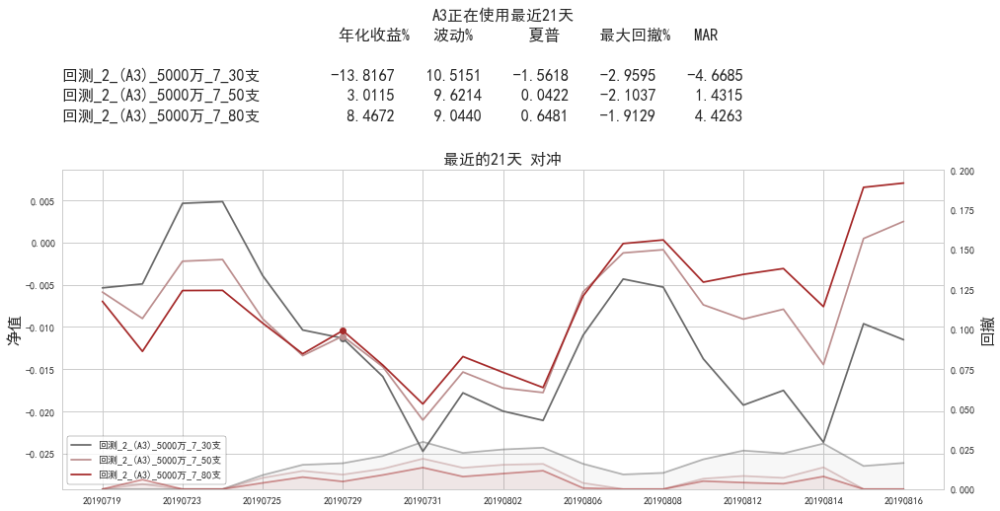

In [26]:
general_plot(file_list = ['回测_2_(A3)_5000万_7_30支.xlsx','回测_2_(A3)_5000万_7_50支.xlsx','回测_2_(A3)_5000万_7_80支.xlsx',], \
             start_together = 1, length_list = [0,42,21], save = ['A3正在使用','A3正在使用最近42天','A3正在使用最近21天'])

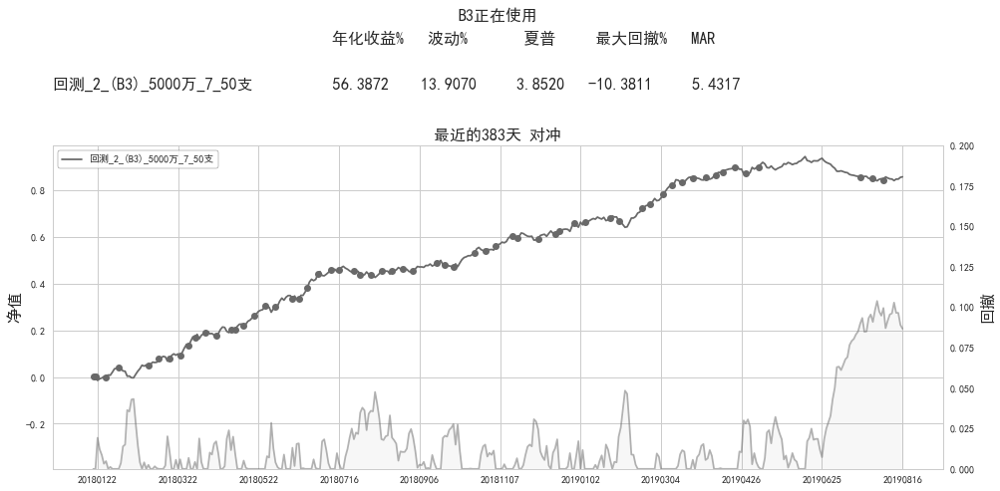

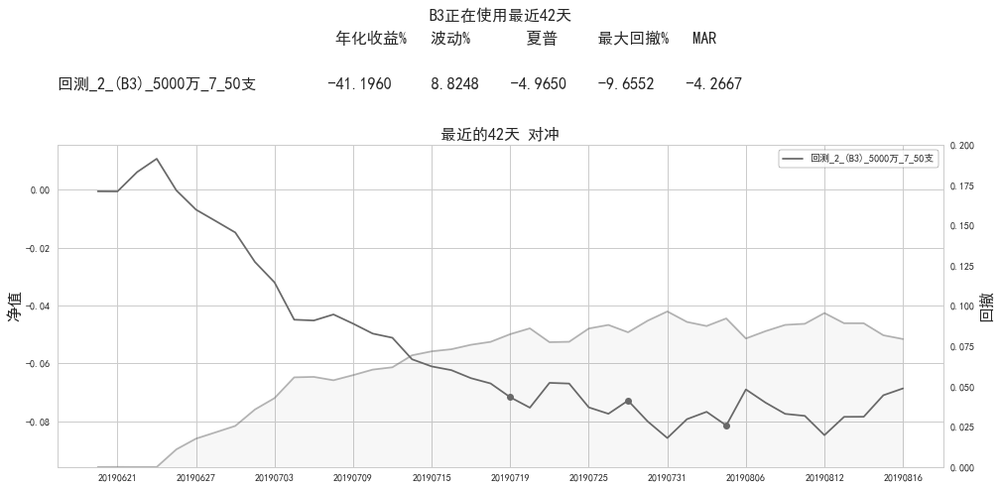

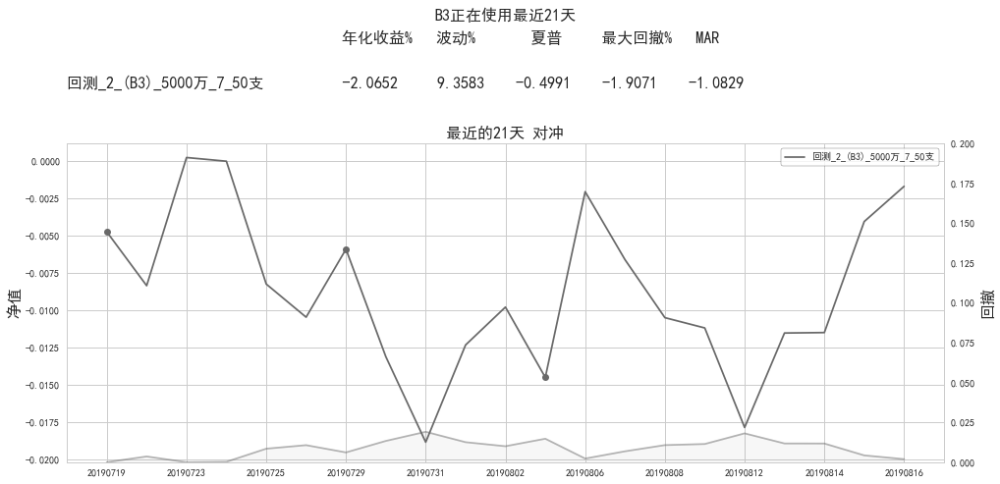

In [27]:
general_plot(file_list = ['回测_2_(B3)_5000万_7_50支.xlsx',], \
             start_together = 1, length_list = [0,42,21], save = ['B3正在使用','B3正在使用最近42天','B3正在使用最近21天'])

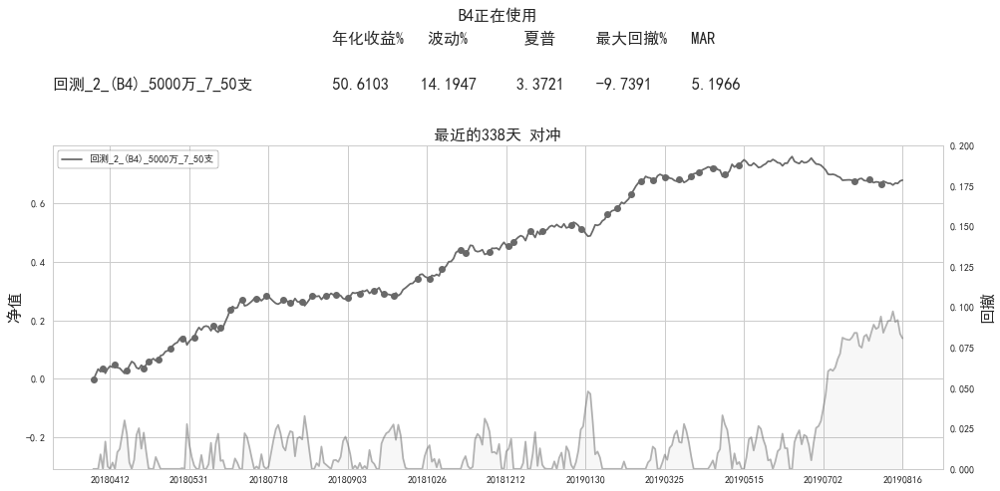

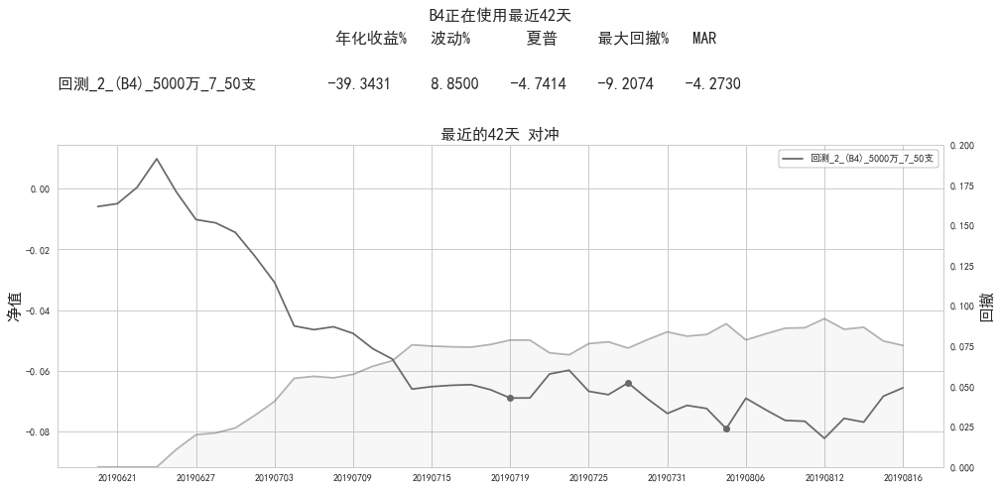

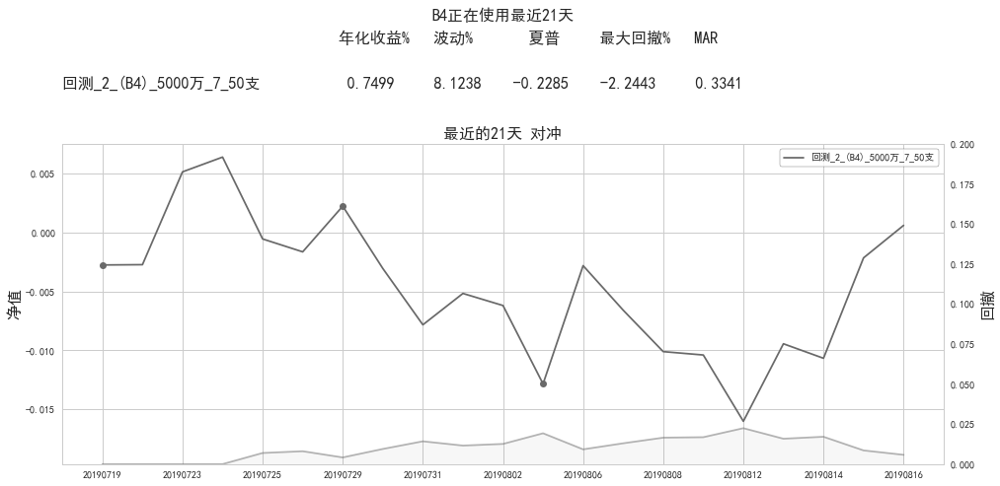

In [28]:
general_plot(file_list = ['回测_2_(B4)_5000万_7_50支.xlsx',], \
             start_together = 1, length_list = [0,42,21], save = ['B4正在使用','B4正在使用最近42天','B4正在使用最近21天'])

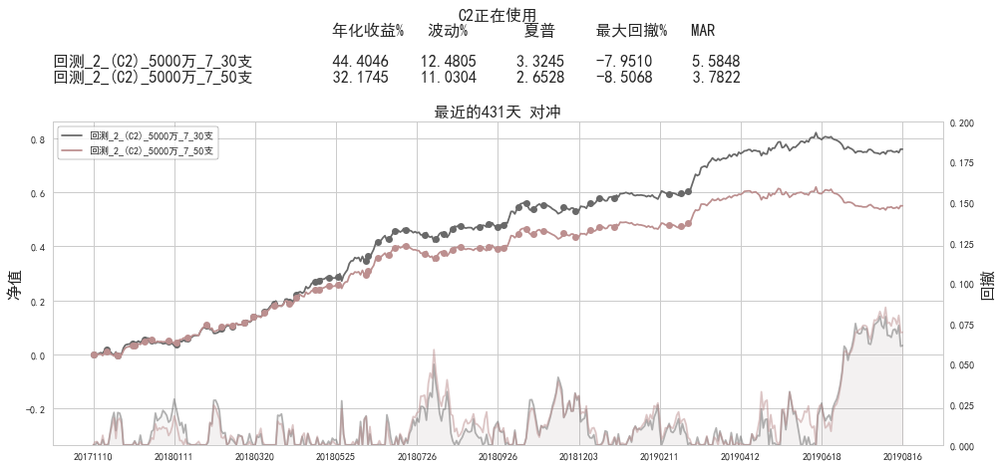

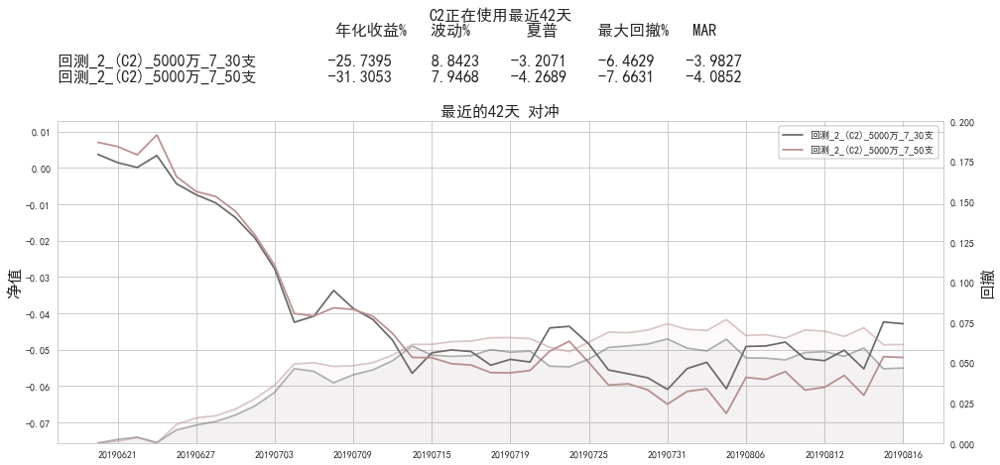

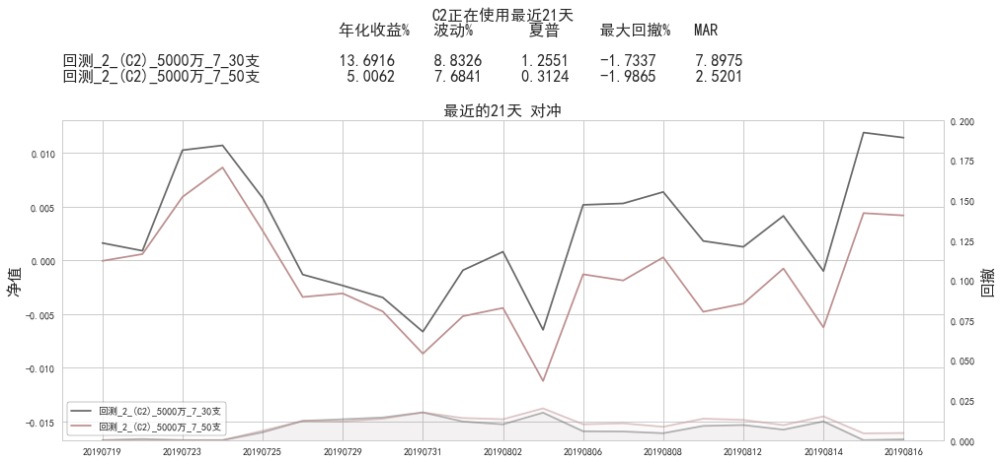

In [29]:
general_plot(file_list = ['回测_2_(C2)_5000万_7_30支.xlsx', '回测_2_(C2)_5000万_7_50支.xlsx',], \
             start_together = 1, length_list = [0,42,21], save = ['C2正在使用','C2正在使用最近42天','C2正在使用最近21天'])

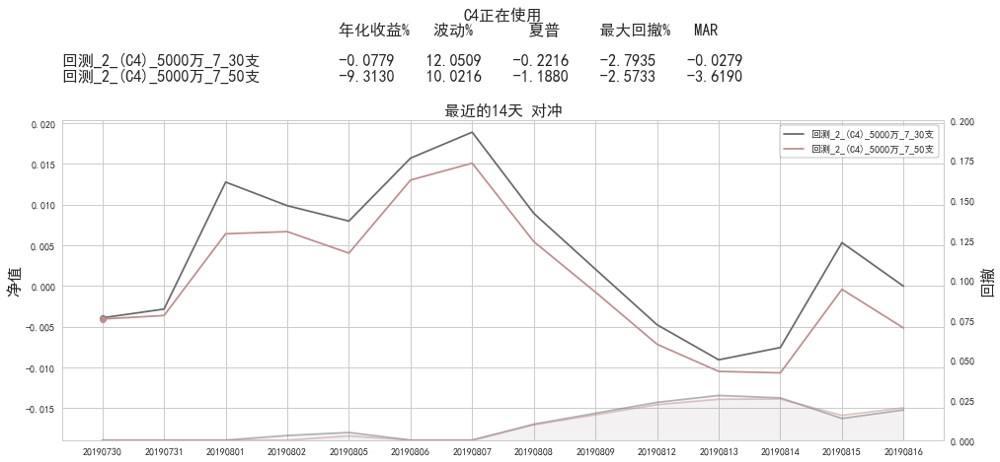

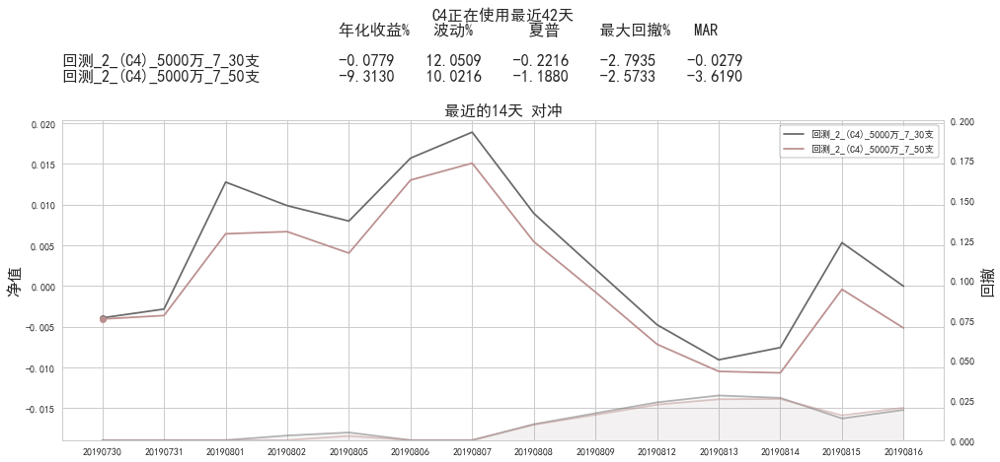

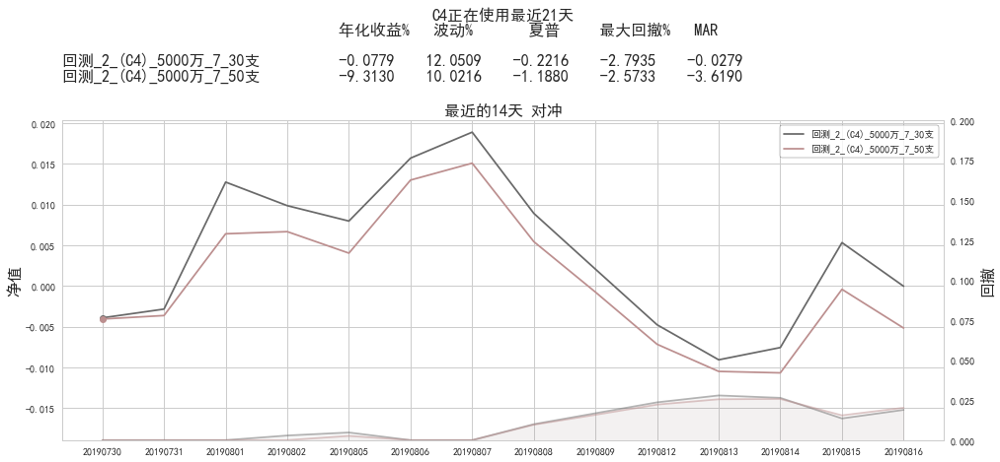

In [30]:
general_plot(file_list = ['回测_2_(C4)_5000万_7_30支.xlsx', '回测_2_(C4)_5000万_7_50支.xlsx',], \
             start_together = 1, length_list = [0,42,21], save = ['C4正在使用','C4正在使用最近42天','C4正在使用最近21天'])

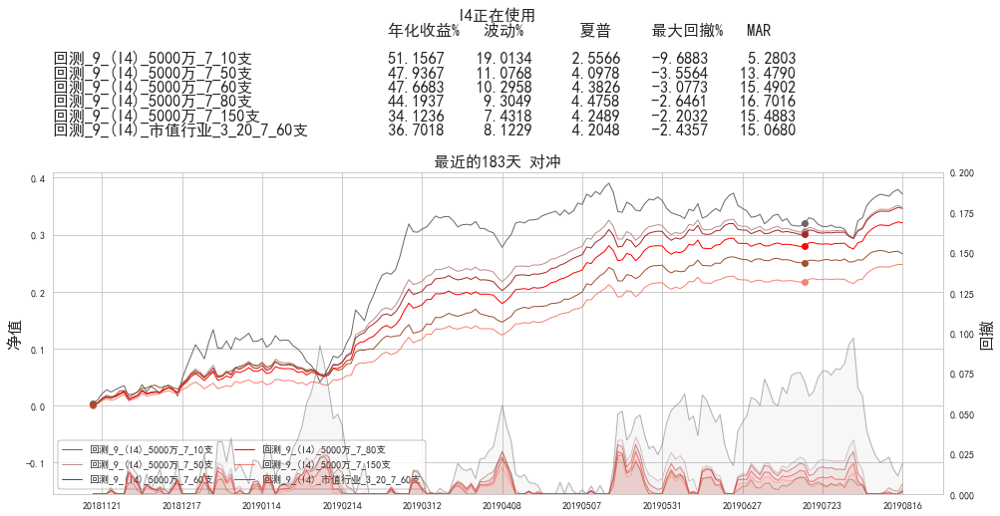

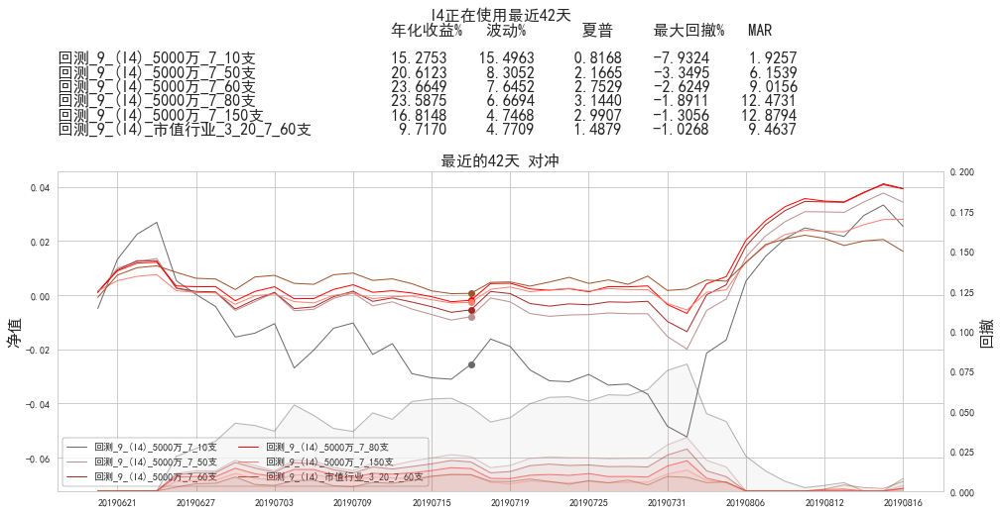

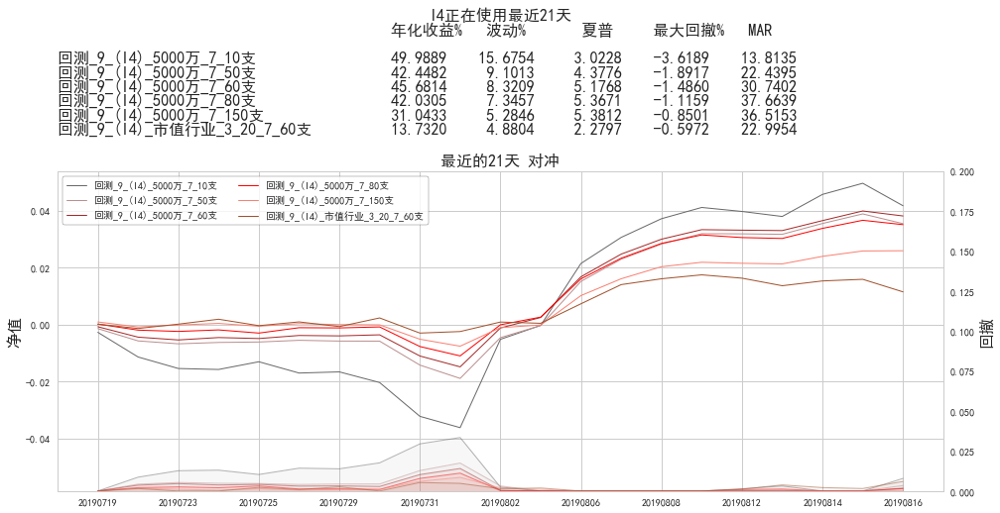

In [31]:
general_plot(file_list = ['回测_9_(I4)_5000万_7_10支.xlsx', '回测_9_(I4)_5000万_7_50支.xlsx', '回测_9_(I4)_5000万_7_60支.xlsx', \
                          '回测_9_(I4)_5000万_7_80支.xlsx', '回测_9_(I4)_5000万_7_150支.xlsx', '回测_9_(I4)_市值行业_3_20_7_60支.xlsx',], \
             start_together = 1, length_list = [0,42,21], save = ['I4正在使用','I4正在使用最近42天','I4正在使用最近21天'])

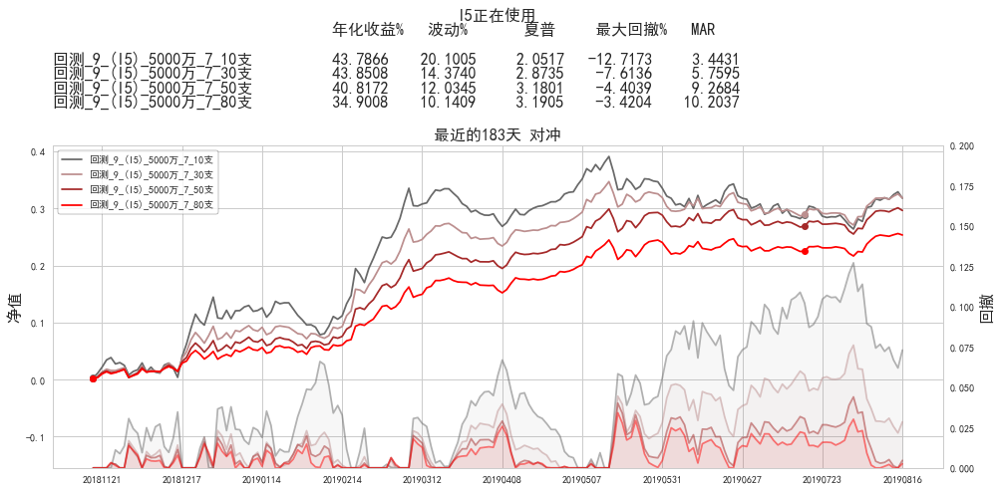

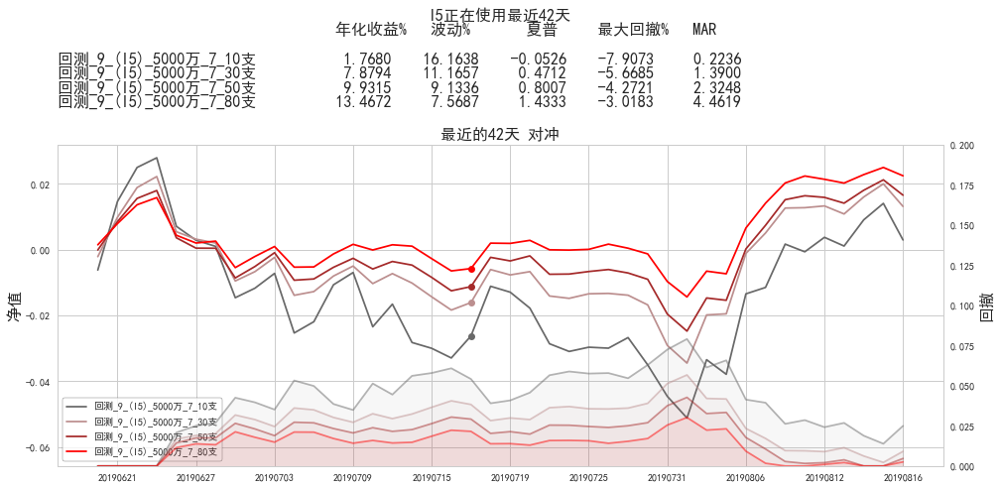

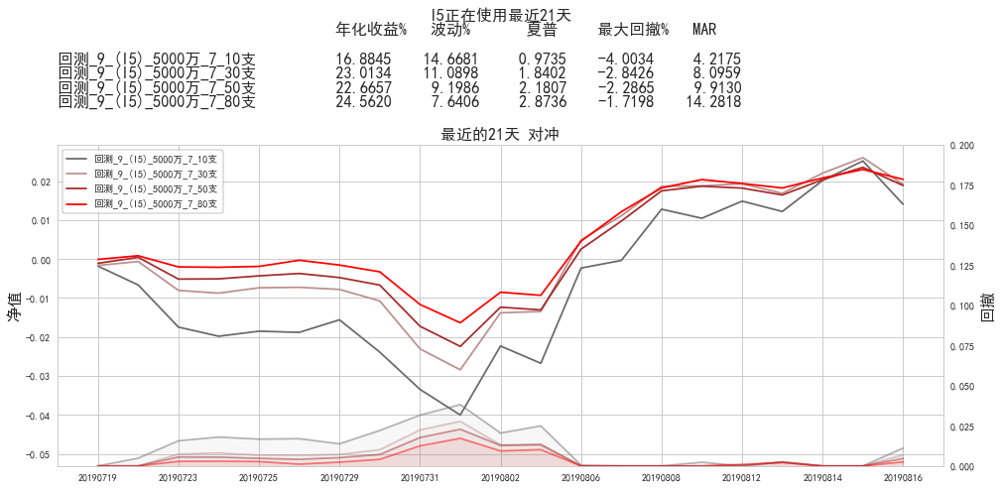

In [32]:
general_plot(file_list = ['回测_9_(I5)_5000万_7_10支.xlsx', '回测_9_(I5)_5000万_7_30支.xlsx', '回测_9_(I5)_5000万_7_50支.xlsx', \
                          '回测_9_(I5)_5000万_7_80支.xlsx', ], \
             start_together = 1, length_list = [0,42,21], save = ['I5正在使用','I5正在使用最近42天','I5正在使用最近21天'])

In [36]:
zhanghuzijin = '账户资金20190816.xlsx'

In [37]:
#capital
os.chdir(r'C:/Users/bj/Desktop/刘泽丹/Code/')
zijin = pd.read_excel(zhanghuzijin)
os.chdir(r'F:\金湖回测系统\6日循环\结果存放文件夹')
dic = {}
for j in zijin.index:
    model_str = zijin.loc[j,'买入股票'].replace('(','（').replace(')','）').\
        replace('（原汁原味）','(原味)').replace('（原味）','(原味)').replace('（原汁）','(原味)').split('（')[0].replace('41支','40支')
    if model_str not in dic.keys():
        dic[model_str] = zijin.loc[j,'要买资金']
    else:
        dic[model_str] += zijin.loc[j,'要买资金']
capital = pd.DataFrame.from_dict(dic,orient='index')[0]
capital = capital.reset_index()
order = []
for i in range(len(capital)):
    order.append(preset_hold_days(capital.iloc[i,0].split('_')[0].split(' ')[0]))
capital['nday'] = order
capital['total'] = capital[0]*capital['nday']
capital = capital.set_index('index')['total']
capital.index = [i.replace('_'+last_date.replace('-',''),'') for i in capital.index]

In [38]:
(capital/(capital.sum())).sort_index()

A3_30支              0.002793
A3_50支              0.015502
A3_80支              0.158540
B3_50支              0.014390
B4_50支              0.018470
C2_30支              0.002793
C2_50支              0.014025
C4_30支              0.003963
C4_50支              0.017841
I4 10支              0.001900
I4 150支             0.118053
I4 3*20 60支 市值行业    0.045864
I4 50支              0.120971
I4 60支              0.013505
I4 80支              0.179004
I5 10支              0.000564
I5 30支              0.006971
I5 50支              0.235928
I5 80支              0.011330
K4_50支              0.006215
K6_50支              0.011378
Name: total, dtype: float64

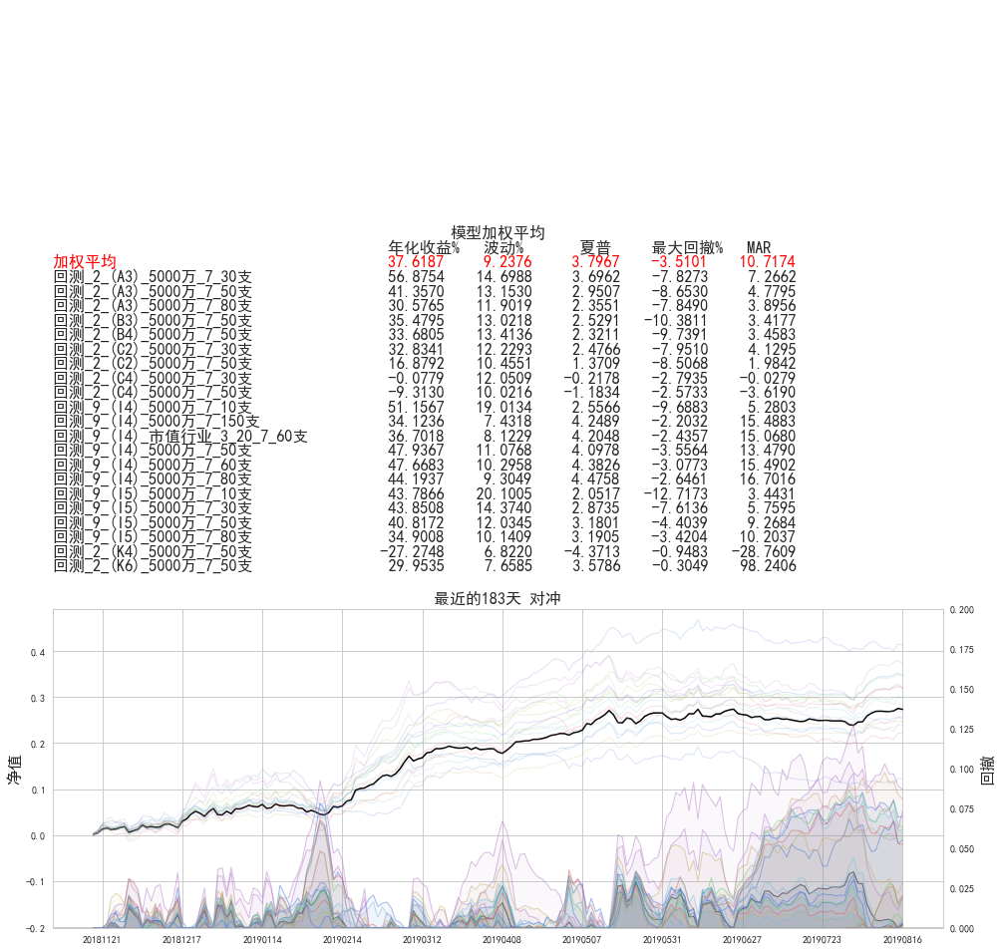

In [39]:
general_plot(file_list = ['回测_2_(A3)_5000万_7_30支.xlsx', \
                          '回测_2_(A3)_5000万_7_50支.xlsx', \
                          '回测_2_(A3)_5000万_7_80支.xlsx', \
                          '回测_2_(B3)_5000万_7_50支.xlsx', \
                          '回测_2_(B4)_5000万_7_50支.xlsx', \
                          '回测_2_(C2)_5000万_7_30支.xlsx', \
                          '回测_2_(C2)_5000万_7_50支.xlsx', \
                          '回测_2_(C4)_5000万_7_30支.xlsx', \
                          '回测_2_(C4)_5000万_7_50支.xlsx', \
                          '回测_9_(I4)_5000万_7_10支.xlsx', \
                          '回测_9_(I4)_5000万_7_150支.xlsx', \
                          '回测_9_(I4)_市值行业_3_20_7_60支.xlsx', \
                          '回测_9_(I4)_5000万_7_50支.xlsx', \
                          '回测_9_(I4)_5000万_7_60支.xlsx', \
                          '回测_9_(I4)_5000万_7_80支.xlsx', \
                          '回测_9_(I5)_5000万_7_10支.xlsx', \
                          '回测_9_(I5)_5000万_7_30支.xlsx', \
                          '回测_9_(I5)_5000万_7_50支.xlsx', \
                          '回测_9_(I5)_5000万_7_80支.xlsx', \
                          '回测_2_(K4)_5000万_7_50支.xlsx', \
                          '回测_2_(K6)_5000万_7_50支.xlsx', ], \
             start_together = 1, start_date = 20181119, weights = (capital/(capital.sum())).sort_index().tolist(), \
             save = ['模型加权平均'])

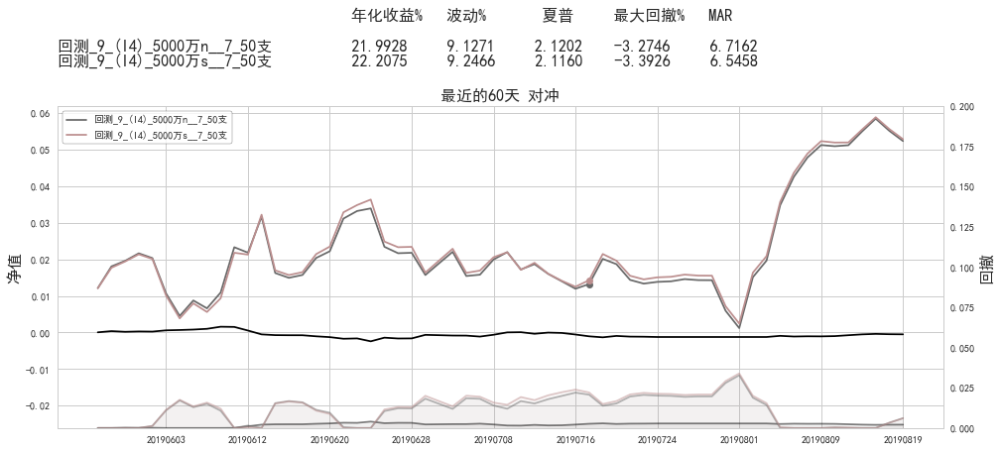

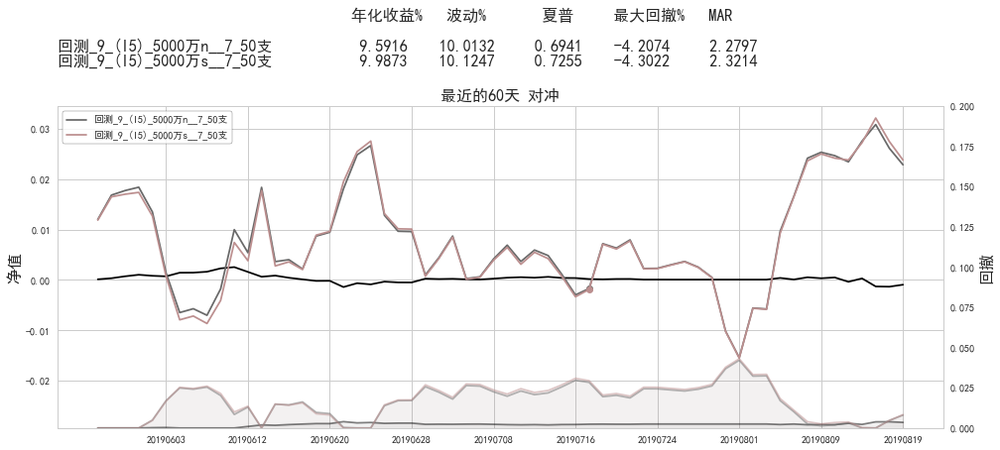

In [13]:
general_plot(file_list = ['回测_9_(I4)_5000万n__7_50支.xlsx','回测_9_(I4)_5000万s__7_50支.xlsx'], \
             substract = True, length_list = [60])
general_plot(file_list = ['回测_9_(I5)_5000万n__7_50支.xlsx','回测_9_(I5)_5000万s__7_50支.xlsx'], \
             substract = True, length_list = [60])

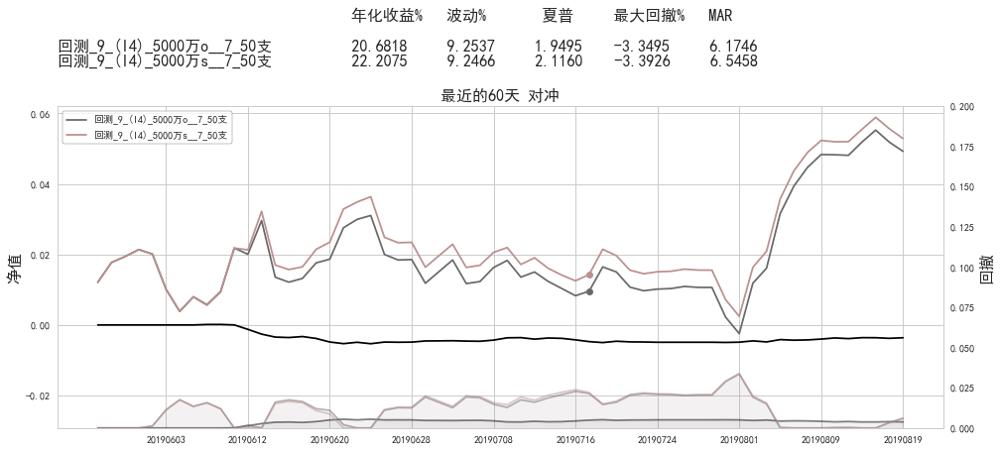

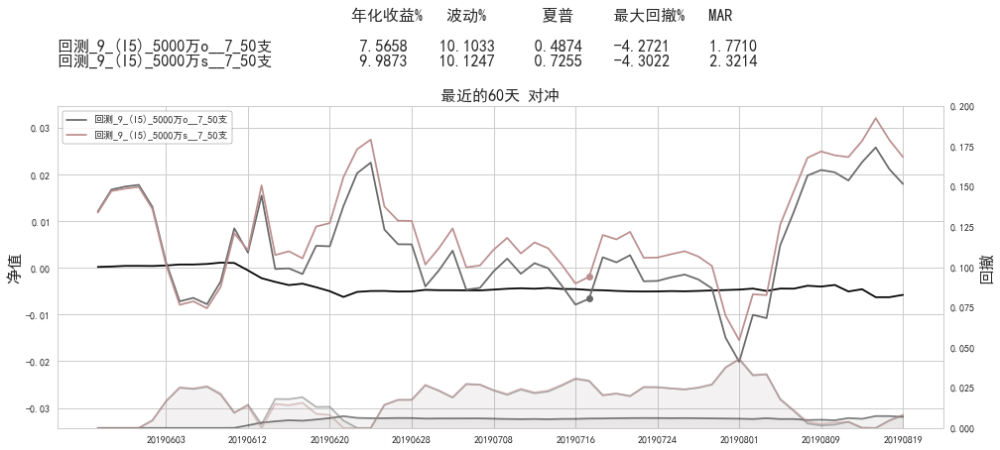

In [14]:
general_plot(file_list = ['回测_9_(I4)_5000万o__7_50支.xlsx','回测_9_(I4)_5000万s__7_50支.xlsx'], \
             substract = True, length_list = [60])
general_plot(file_list = ['回测_9_(I5)_5000万o__7_50支.xlsx','回测_9_(I5)_5000万s__7_50支.xlsx'], \
             substract = True, length_list = [60])

In [ ]:
general_plot(file_list = ['回测_2_(result831_1)_7_10支.xlsx',
                          '回测_2_(result831_1)_7_20支.xlsx',
                          '回测_2_(result831_1)_7_30支.xlsx',
                          '回测_2_(result831_1)_7_40支.xlsx',
                          '回测_2_(result831_1)_7_50支.xlsx',
                          ], \
             start_together = 0,)

In [ ]:
general_plot(file_list = ['回测_2_(result831_2)_7_10支.xlsx',
                          '回测_2_(result831_2)_7_20支.xlsx',
                          '回测_2_(result831_2)_7_30支.xlsx',
                          '回测_2_(result831_2)_7_40支.xlsx',
                          '回测_2_(result831_2)_7_50支.xlsx',
                          ], \
             start_together = 0,)

In [ ]:
general_plot(file_list = ['回测_2_(result831_1)_5000万_7_10支.xlsx',
                          '回测_2_(result831_1)_5000万_7_20支.xlsx',
                          '回测_2_(result831_1)_5000万_7_30支.xlsx',
                          '回测_2_(result831_1)_5000万_7_40支.xlsx',
                          '回测_2_(result831_1)_5000万_7_50支.xlsx',
                          ], \
             start_together = 0,)

In [ ]:
general_plot(file_list = ['回测_2_(result831_2)_5000万_7_10支.xlsx',
                          '回测_2_(result831_2)_5000万_7_20支.xlsx',
                          '回测_2_(result831_2)_5000万_7_30支.xlsx',
                          '回测_2_(result831_2)_5000万_7_40支.xlsx',
                          '回测_2_(result831_2)_5000万_7_50支.xlsx',
                          ], \
             start_together = 0,)

In [ ]:
general_plot(file_list = ['回测_2_(B3)_7_50支.xlsx','回测_2_(B4)_7_50支.xlsx',
                          '回测_2_(result831_1)_7_50支.xlsx',
                          '回测_2_(result831_2)_7_50支.xlsx',
                          '回测_2_(8.31_2_handout_a1_1812_1840)_7_50支.xlsx',
                          '回测_2_(8.31_2_handout_a2_1812_1846)_7_50支.xlsx',
                          ], \
             start_together = 1, start_date = 20190710)

In [ ]:
general_plot(file_list = ['回测_2_(B3)_5000万_7_50支.xlsx','回测_2_(B4)_5000万_7_50支.xlsx',
                          '回测_2_(result831_1)_5000万_7_50支.xlsx',
                          '回测_2_(result831_2)_5000万_7_50支.xlsx',
                          '回测_2_(8.31_2_handout_a1_1812_1840)_5000万_7_50支.xlsx',
                          '回测_2_(8.31_2_handout_a2_1812_1846)_5000万_7_50支.xlsx',
                          ], \
             start_together = 1, start_date = 20190710)

In [ ]:
general_plot(file_list = ['回测_2_(K4)_5000万_7_50支.xlsx',
                          '回测_2_(K5)_5000万_7_50支.xlsx',
                          '回测_2_(K6)_5000万_7_50支.xlsx',
                          '回测_2_(K7)_5000万_7_50支.xlsx',
                          ], \
             start_together = 0)